In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import pandas as pd

# Assuming your file is in Excel format, use read_excel
data = pd.read_excel('/content/drive/MyDrive/Olive/olive_dataset1.xlsx')
data.head()


,Age yr BP,Olive influx (grains cm-2 yr-1),LOESS smooth.,2.5 percentile,97.5 percentile,Annual_1,Sd_1,January,Sd_2,February-March,...,Tmax Summer,Sd_7,Annual_2,Sd_8,Spring_2,Sd_9,Summer_2,Sd_10,October-November,Sd_11
0,2349,39.000000,39.000000,11.577924,64.262421,15.083333,0.195789,6.300000,0.300000,8.300000,...,28.230000,0.1,552.700000,8.100000,132.800000,4.500000,45.500000,8.100000,109.600000,3.300000
1,2369,37.869565,37.869565,22.224656,52.608346,14.973188,0.209101,6.126087,0.317391,8.152174,...,28.219565,0.1,542.769565,8.552174,128.591304,4.708696,43.413043,8.569565,107.547826,3.508696
2,2389,36.739130,36.739130,23.310060,50.427797,14.863043,0.222414,5.952174,0.334783,8.004348,...,28.209130,0.1,532.839130,9.004348,124.382609,4.917391,41.326087,9.039130,105.495652,3.717391
3,2409,35.608696,35.608696,21.430748,50.483866,14.752899,0.235726,5.778261,0.352174,7.856522,...,28.198696,0.1,522.908696,9.456522,120.173913,5.126087,39.239130,9.508696,103.443478,3.926087
4,2429,34.478261,34.478261,20.252595,50.000837,14.642754,0.249039,5.604348,0.369565,7.708696,...,28.188261,0.1,512.978261,9.908696,115.965217,5.334783,37.152174,9.978261,101.391304,4.134783


In [3]:
import pandas as pd

column_to_delete = ['Sd_2', 'Sd_3', 'Sd_4', 'Sd_5', 'Sd_6', 'Sd_7', 'Sd_8', 'Sd_9', 'Sd_10', 'Sd_11']
data = data.drop(column_to_delete, axis=1)

output_file_path = '/content/drive/MyDrive/Olive/update_olive_dataset3.xlsx'
data.to_excel(output_file_path, index=False)

In [4]:
data = pd.read_excel('/content/drive/MyDrive/Olive/update_olive_dataset3.xlsx')
data.head()

,Age yr BP,Olive influx (grains cm-2 yr-1),LOESS smooth.,2.5 percentile,97.5 percentile,Annual_1,Sd_1,January,February-March,Spring_1,Summer_1,Tmin January,Tmax Summer,Annual_2,Spring_2,Summer_2,October-November
0,2349,39.000000,39.000000,11.577924,64.262421,15.083333,0.195789,6.300000,8.300000,13.633333,22.533333,3.000000,28.230000,552.700000,132.800000,45.500000,109.600000
1,2369,37.869565,37.869565,22.224656,52.608346,14.973188,0.209101,6.126087,8.152174,13.552174,22.457971,2.982609,28.219565,542.769565,128.591304,43.413043,107.547826
2,2389,36.739130,36.739130,23.310060,50.427797,14.863043,0.222414,5.952174,8.004348,13.471014,22.382609,2.965217,28.209130,532.839130,124.382609,41.326087,105.495652
3,2409,35.608696,35.608696,21.430748,50.483866,14.752899,0.235726,5.778261,7.856522,13.389855,22.307246,2.947826,28.198696,522.908696,120.173913,39.239130,103.443478
4,2429,34.478261,34.478261,20.252595,50.000837,14.642754,0.249039,5.604348,7.708696,13.308696,22.231884,2.930435,28.188261,512.978261,115.965217,37.152174,101.391304


In [5]:
X = data.drop(['Olive influx (grains cm-2 yr-1)'], axis=1)
y = data['Olive influx (grains cm-2 yr-1)']

# Display the modified feature dataset
print(X)

# Display the target dataset
print(y)



     Age yr BP  LOESS smooth.  2.5 percentile  97.5 percentile   Annual_1  \
0         2349      39.000000       11.577924        64.262421  15.083333   
1         2369      37.869565       22.224656        52.608346  14.973188   
2         2389      36.739130       23.310060        50.427797  14.863043   
3         2409      35.608696       21.430748        50.483866  14.752899   
4         2429      34.478261       20.252595        50.000837  14.642754   
..         ...            ...             ...              ...        ...   
264       7629     138.272727      108.627372       150.094978  18.005208   
265       7649     109.300000       66.927332       109.871278  18.197917   
266       7669     127.836526      109.217057       162.585688  18.175000   
267       7689     129.612308      122.884616       161.944262  18.008333   
268       7709     128.880353      113.196615       173.946806  18.081566   

         Sd_1   January  February-March   Spring_1   Summer_1  Tmin January

Data Summary:
   Age yr BP  Olive influx (grains cm-2 yr-1)  LOESS smooth.  2.5 percentile  \
0       2349                        39.000000      39.000000       11.577924   
1       2369                        37.869565      37.869565       22.224656   
2       2389                        36.739130      36.739130       23.310060   
3       2409                        35.608696      35.608696       21.430748   
4       2429                        34.478261      34.478261       20.252595   

   97.5 percentile   Annual_1      Sd_1   January  February-March   Spring_1  \
0        64.262421  15.083333  0.195789  6.300000        8.300000  13.633333   
1        52.608346  14.973188  0.209101  6.126087        8.152174  13.552174   
2        50.427797  14.863043  0.222414  5.952174        8.004348  13.471014   
3        50.483866  14.752899  0.235726  5.778261        7.856522  13.389855   
4        50.000837  14.642754  0.249039  5.604348        7.708696  13.308696   

    Summer_1  Tmin Janua

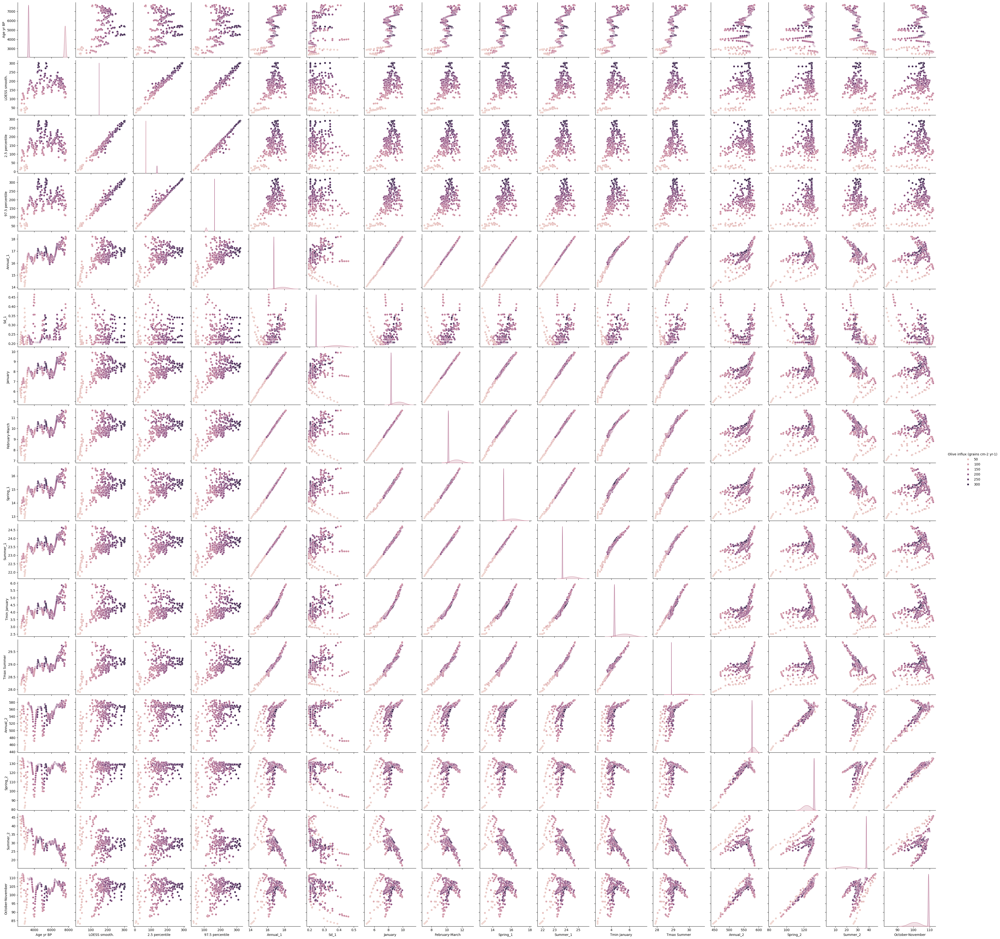

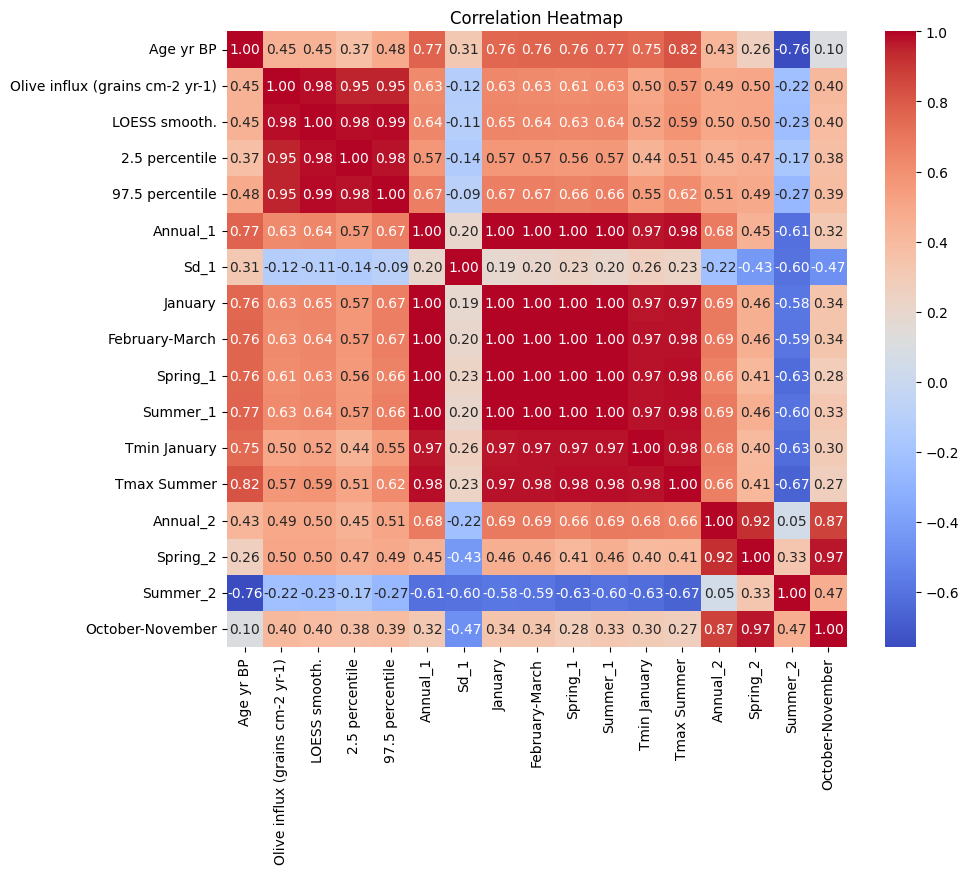

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt  # Import matplotlib.pyplot


# Step : Data Summary
print("Data Summary:")
print(data.head())
print("\nData Info:")
print(data.info())
print("\nData Statistics:")
print(data.describe())

# Step : Data Visualization and EDA
# Pairplot for visualizing relationships between features
sns.pairplot(data, hue='Olive influx (grains cm-2 yr-1)', diag_kind='kde')
plt.show()

# Correlation Heatmap
corr = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()



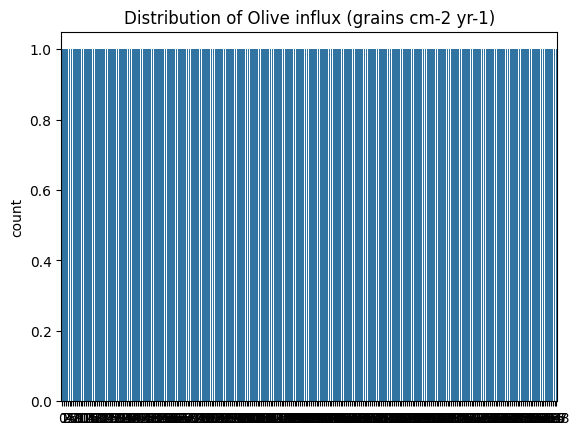

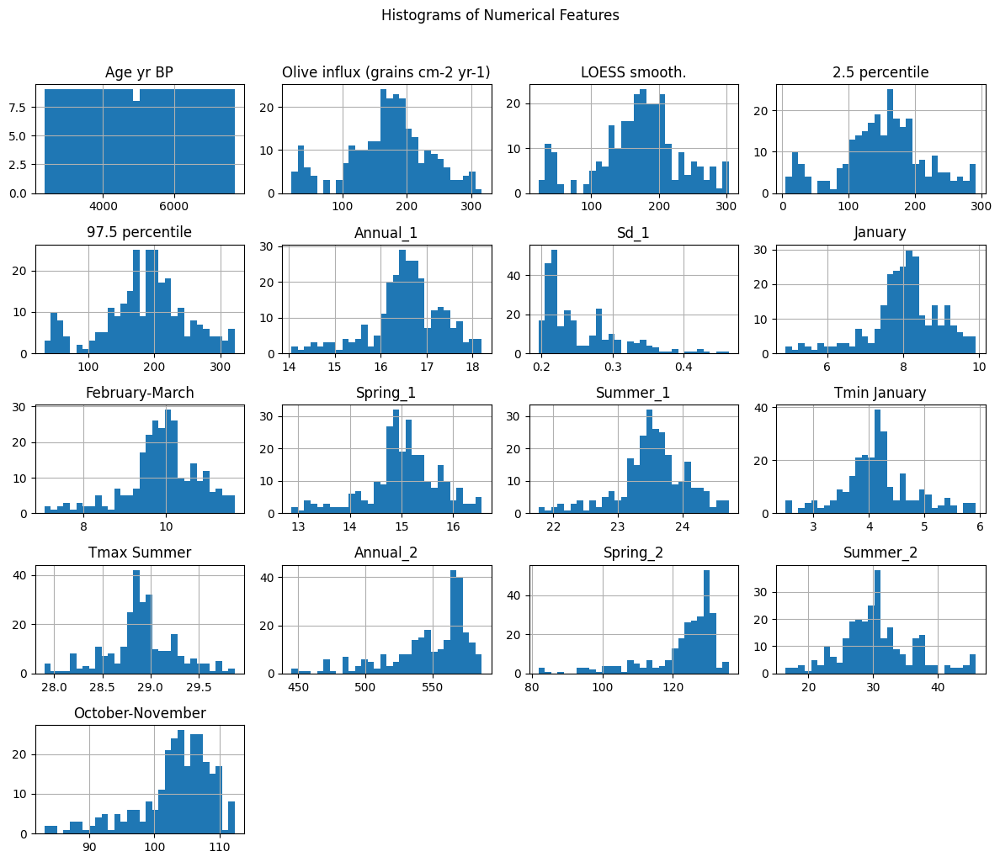

In [7]:
# Distribution of the target variable 'Outcome'
sns.countplot(data['Olive influx (grains cm-2 yr-1)'])
plt.title('Distribution of Olive influx (grains cm-2 yr-1)')
plt.show()

# Histograms of numerical features
data.hist(figsize=(12, 10), bins=30)
plt.suptitle("Histograms of Numerical Features", y=1.02)
plt.tight_layout()
plt.show()


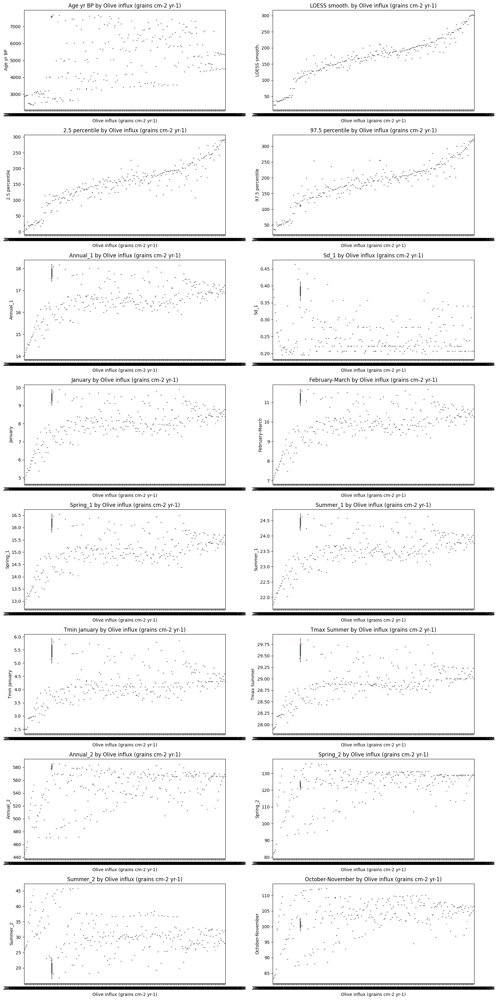

In [8]:
import seaborn as sns

# Boxplots for numerical features by Outcome
numerical_features = data.drop('Olive influx (grains cm-2 yr-1)', axis=1).columns
num_features = len(numerical_features)

# Adjust the subplot configuration based on the number of features
num_rows = (num_features // 2) + (num_features % 2)
num_cols = 2

plt.figure(figsize=(16, 4 * num_rows))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(x='Olive influx (grains cm-2 yr-1)', y=feature, data=data)
    plt.title(f'{feature} by Olive influx (grains cm-2 yr-1)')
plt.tight_layout()
plt.show()


In [9]:
# Split the data into train, test, and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


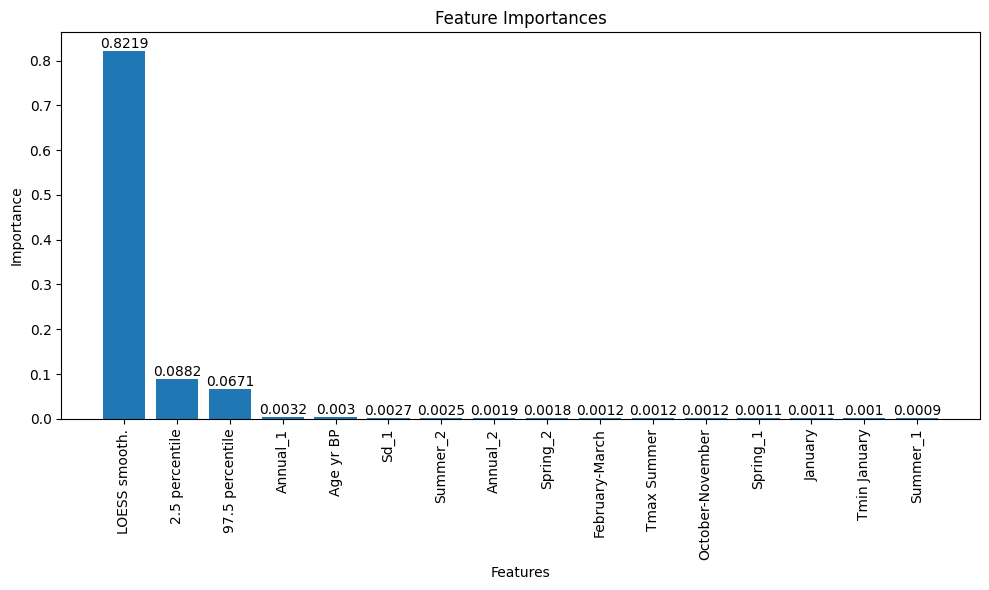

In [10]:

model = RandomForestRegressor()
model.fit(X_train, y_train)


# Importance for Select the desired features by column
# Select the desired features
selected_features = ['Age yr BP', 'LOESS smooth.', '2.5 percentile', '97.5 percentile', 'Annual_1', 'Sd_1', 'January', 'February-March', 'Spring_1', 'Summer_1', 'Tmin January', 'Tmax Summer', 'Annual_2', 'Spring_2', 'Summer_2', 'October-November']

# Extract feature importances for selected features
importances = model.feature_importances_
feature_names = X.columns

selected_importances = []
for feature in selected_features:
    if feature in feature_names:
        feature_index = np.where(feature_names == feature)[0][0]
        selected_importances.append(importances[feature_index])
    else:
        selected_importances.append(0)  # Assign 0 importance if feature not found

# Create a DataFrame with selected feature names and importance scores
selected_feature_importances = pd.DataFrame({'Feature': selected_features, 'Importance': selected_importances})

# Sort the DataFrame by importance scores in descending order
selected_feature_importances = selected_feature_importances.sort_values('Importance', ascending=False)


# Plot the feature importances with values displayed inside the bars
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
bars = plt.bar(selected_feature_importances['Feature'], selected_feature_importances['Importance'])
plt.xlabel("Features")
plt.ylabel("Importance")
plt.xticks(rotation=90)
plt.tight_layout()

# Add value labels to the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 4), ha='center', va='bottom')

plt.show()



Cross-Validation RMSE Scores: [10.34261452 13.61595421 16.61286104 12.40177054 16.77866862]
Mean Cross-Validation RMSE: 13.950373787736357


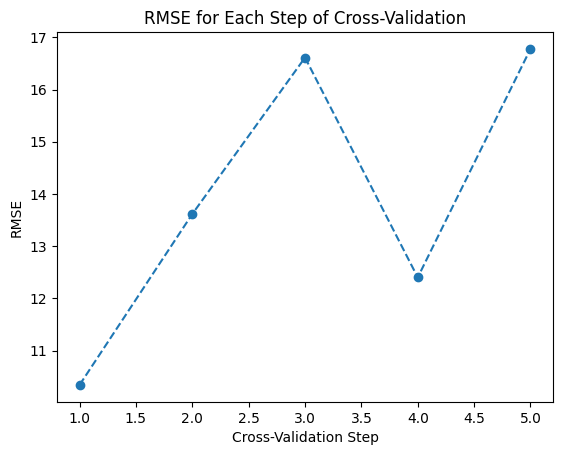

In [11]:
rf_regressor = RandomForestRegressor()
rf_regressor.fit(X_train, y_train)
cv_scores = cross_val_score(rf_regressor, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = (-cv_scores) ** 0.5
print("Cross-Validation RMSE Scores:", cv_rmse_scores)
print("Mean Cross-Validation RMSE:", cv_rmse_scores.mean())

# Plot RMSE for each step of cross-validation
plt.plot(range(1, 6), cv_rmse_scores, marker='o', linestyle='--')
plt.xlabel('Cross-Validation Step')
plt.ylabel('RMSE')
plt.title('RMSE for Each Step of Cross-Validation')
plt.show()

In [12]:
# Predict on the test set
y_pred_test = rf_regressor.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error, Mean Absolute Error)
mse = mean_squared_error(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

# Print the evaluation metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)


Mean Squared Error: 206.53671815785978
Mean Absolute Error: 10.802204721536665


In [13]:
# Predict on the validation set
y_pred_val = rf_regressor.predict(X_val)

# Calculate evaluation metrics for validation set
mse_val = mean_squared_error(y_val, y_pred_val)
mae_val = mean_absolute_error(y_val, y_pred_val)

# Print the evaluation metrics for validation set
print("Validation Mean Squared Error:", mse_val)
print("Validation Mean Absolute Error:", mae_val)


Validation Mean Squared Error: 179.8440100274388
Validation Mean Absolute Error: 9.16589900193353


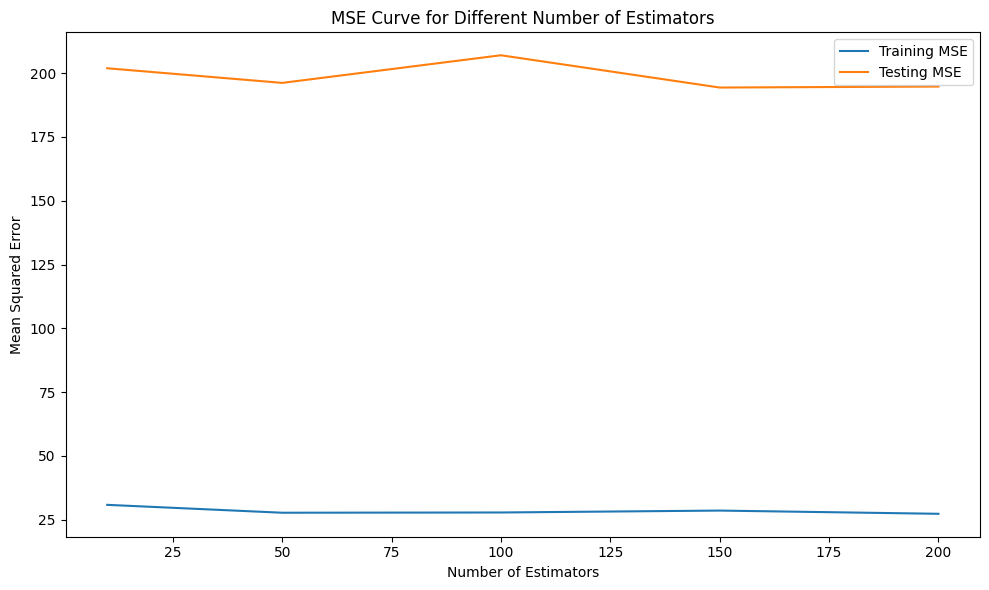

In [14]:
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Define a range of number of trees (estimators)
num_estimators = [10, 50, 100, 150, 200]

train_errors = []
test_errors = []



for n in num_estimators:
    # Train the random forest regression model
    model = RandomForestRegressor(n_estimators=n)
    model.fit(X_train, y_train)

    # Make predictions on the training and testing sets
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate the mean squared errors
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Append the errors to the lists
    train_errors.append(train_error)
    test_errors.append(test_error)

# Plot the MSE curve
plt.figure(figsize=(10, 6))
plt.plot(num_estimators, train_errors, label='Training MSE')
plt.plot(num_estimators, test_errors, label='Testing MSE')
plt.title('MSE Curve for Different Number of Estimators')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.tight_layout()
plt.show()


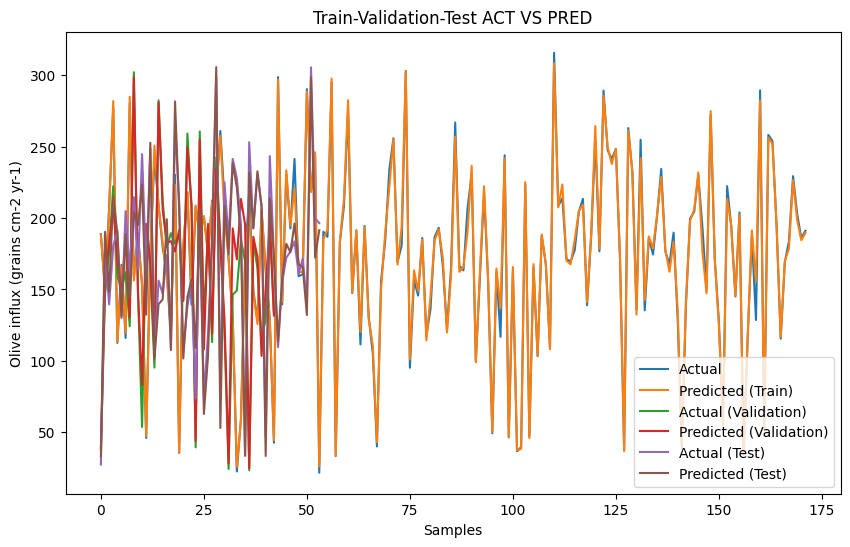

In [15]:
# Calculate the training set predictions
y_pred_train = rf_regressor.predict(X_train)

# Calculate the training set mean squared error
mse_train = mean_squared_error(y_train, y_pred_train)

# Plot the train-test-validation loss curves
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_train)), y_train, label='Actual')
plt.plot(range(len(y_pred_train)), y_pred_train, label='Predicted (Train)')
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val)), y_pred_val, label='Predicted (Validation)')
plt.plot(range(len(y_test)), y_test, label='Actual (Test)')
plt.plot(range(len(y_pred_test)), y_pred_test, label='Predicted (Test)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation-Test ACT VS PRED')
plt.legend()
plt.show()


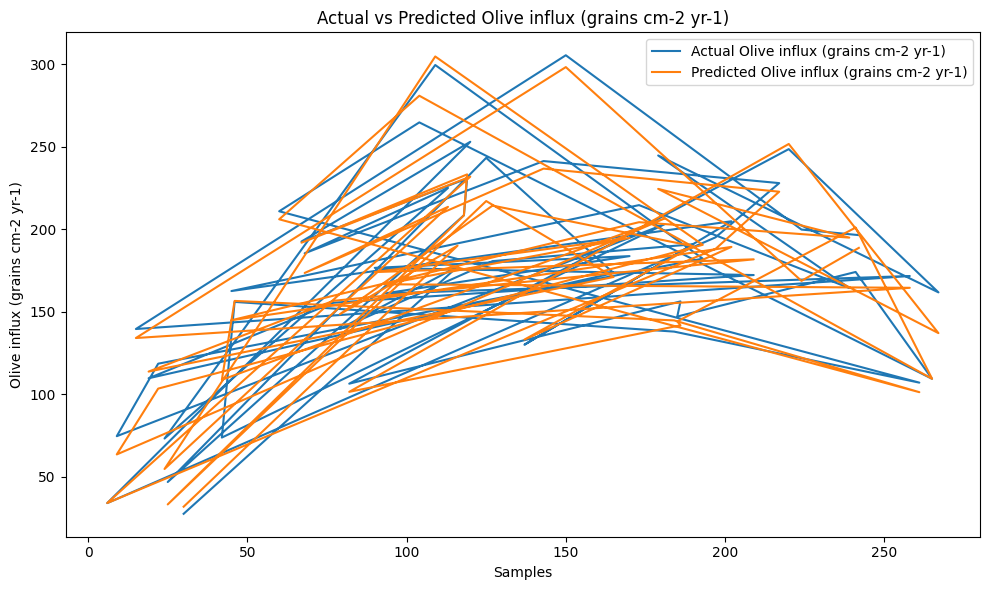

In [16]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame with actual and predicted rent values
rent_comparison = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred})

# Plot the actual versus predicted rent values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.plot(rent_comparison.index, rent_comparison['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)')
plt.plot(rent_comparison.index, rent_comparison['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


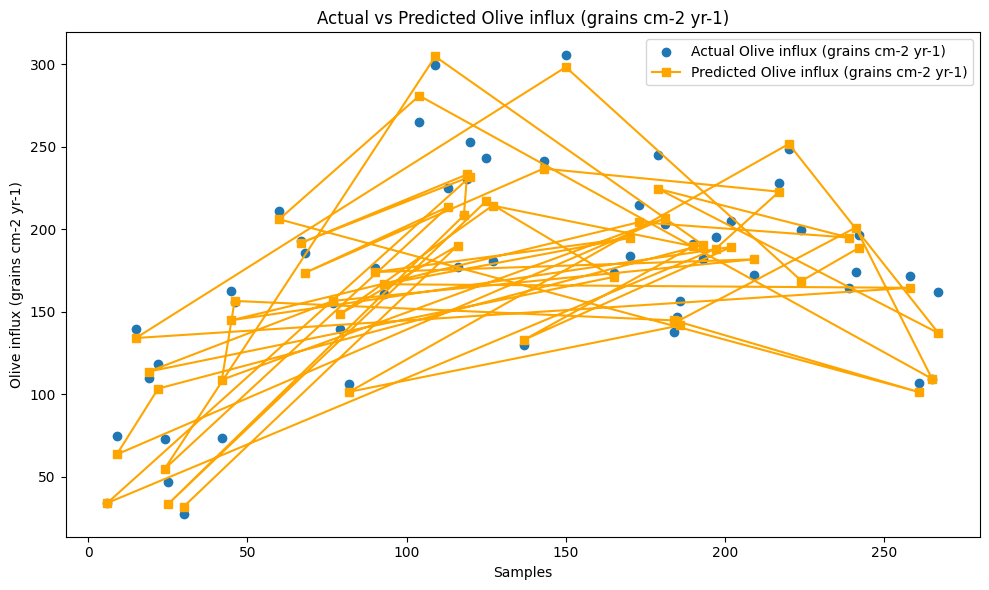

In [17]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame with actual and predicted rent values
rent_comparison = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred})

# Plot the actual versus predicted rent values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.scatter(rent_comparison.index, rent_comparison['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)', marker='o')
plt.plot(rent_comparison.index, rent_comparison['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


In [18]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define the number of estimators
num_estimators = 100  # You can change this to your desired number

# Create and evaluate Random Forest Regressor with a specific number of estimators
forest_model = RandomForestRegressor(n_estimators=num_estimators, random_state=42)
forest_model.fit(X_train, y_train)
forest_pred = forest_model.predict(X_test)

mae = mean_absolute_error(y_test, forest_pred)
mse = mean_squared_error(y_test, forest_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, forest_pred)  # Import r2_score from sklearn.metrics
rmsle = np.sqrt(np.mean(np.log1p(forest_pred) - np.log1p(y_test)) ** 2)
mape = np.mean(np.abs((y_test - forest_pred) / y_test)) * 100

print(f"\nRandom Forest Regressor Model with {num_estimators} Estimators:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")



Random Forest Regressor Model with 100 Estimators:
Mean Absolute Error (MAE): 10.64
Mean Squared Error (MSE): 206.67
Root Mean Squared Error (RMSE): 14.38
R-squared (R2): 0.94
Root Mean Squared Logarithmic Error (RMSLE): 0.02
Mean Absolute Percentage Error (MAPE): 7.59%


Cross-Validation RMSE Scores: [11.29592625  8.44681391 16.49521509  6.54407301 12.22313705]
Mean Cross-Validation RMSE: 11.001033061564634


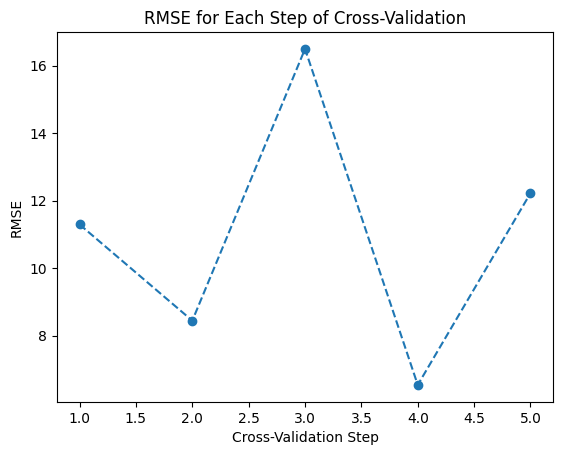

In [19]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt

# Create and fit the linear regression model
lr_regressor = LinearRegression()
lr_regressor.fit(X_train, y_train)

# Perform cross-validation for RMSE
cv_scores = cross_val_score(lr_regressor, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(-cv_scores)  # Calculate RMSE from negative MSE

print("Cross-Validation RMSE Scores:", cv_rmse_scores)
print("Mean Cross-Validation RMSE:", cv_rmse_scores.mean())

# Plot RMSE for each step of cross-validation
plt.plot(range(1, 6), cv_rmse_scores, marker='o', linestyle='--')
plt.xlabel('Cross-Validation Step')
plt.ylabel('RMSE')
plt.title('RMSE for Each Step of Cross-Validation')
plt.show()


In [20]:
# Predict on the test set using the Linear Regression model
y_pred_test = lr_regressor.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error, Mean Absolute Error)
mse = mean_squared_error(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

# Print the evaluation metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

Mean Squared Error: 104.87966339859588
Mean Absolute Error: 6.573009669625458


In [21]:
# Predict on the validation set using the Linear Regression model
y_pred_val = lr_regressor.predict(X_val)

# Calculate evaluation metrics for the validation set
mse_val = mean_squared_error(y_val, y_pred_val)
mae_val = mean_absolute_error(y_val, y_pred_val)

# Print the evaluation metrics for the validation set
print("Validation Mean Squared Error:", mse_val)
print("Validation Mean Absolute Error:", mae_val)


Validation Mean Squared Error: 103.683241846881
Validation Mean Absolute Error: 6.209204984452786


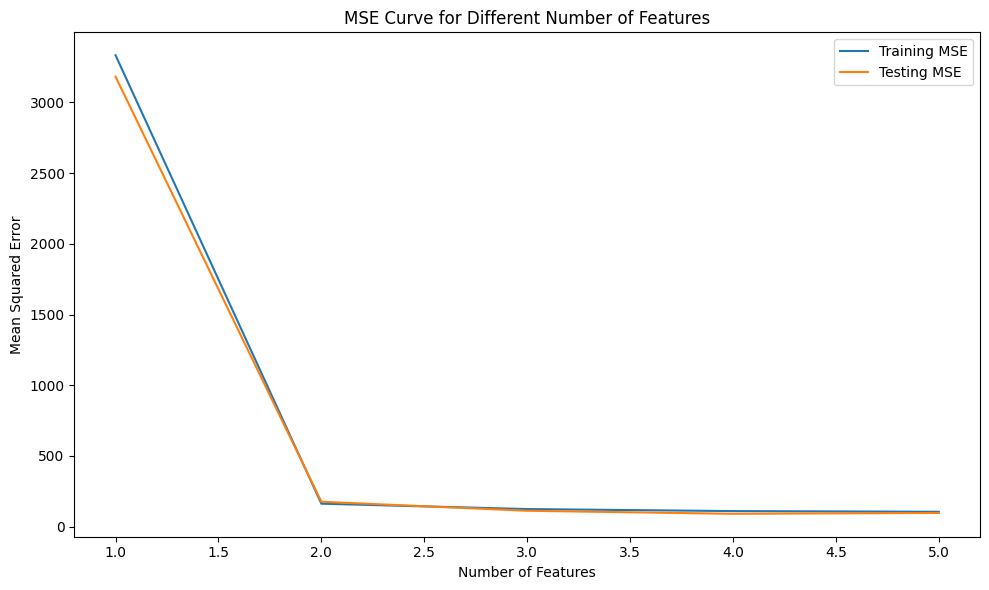

In [22]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Define a range of numbers of features (attributes)
num_features = [1, 2, 3, 4, 5]

train_errors = []
test_errors = []

for n in num_features:
    # Select the first 'n' features for training and testing
    X_train_subset = X_train.iloc[:, :n]
    X_test_subset = X_test.iloc[:, :n]

    # Create and fit the linear regression model
    model = LinearRegression()
    model.fit(X_train_subset, y_train)

    # Make predictions on the training and testing sets
    y_train_pred = model.predict(X_train_subset)
    y_test_pred = model.predict(X_test_subset)

    # Calculate the mean squared errors
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Append the errors to the lists
    train_errors.append(train_error)
    test_errors.append(test_error)

# Plot the MSE curve
plt.figure(figsize=(10, 6))
plt.plot(num_features, train_errors, label='Training MSE')
plt.plot(num_features, test_errors, label='Testing MSE')
plt.title('MSE Curve for Different Number of Features')
plt.xlabel('Number of Features')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.tight_layout()
plt.show()


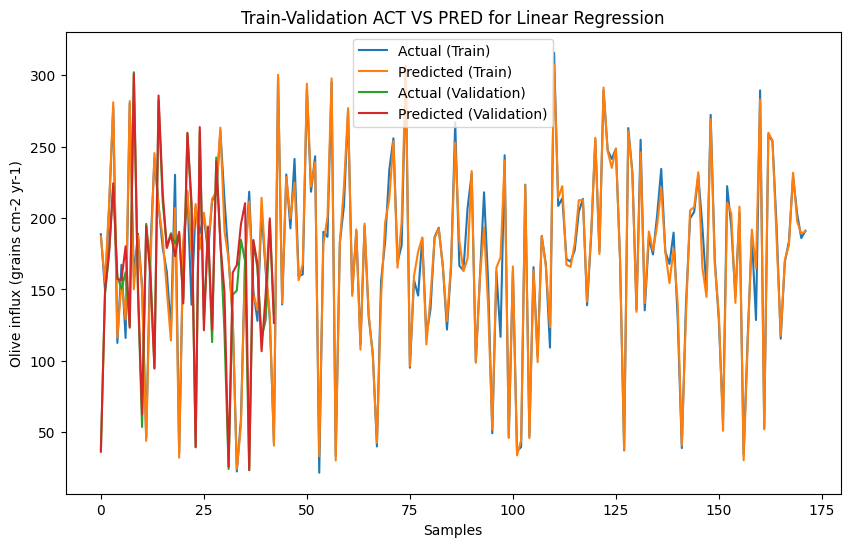

In [23]:
# Calculate the training set predictions for Linear Regression
y_pred_train_lr = lr_regressor.predict(X_train)

# Calculate the training set mean squared error for Linear Regression
mse_train_lr = mean_squared_error(y_train, y_pred_train_lr)

# Calculate the validation set predictions for Linear Regression
y_pred_val_lr = lr_regressor.predict(X_val)

# Plot the train-validation loss curves for Linear Regression
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_train)), y_train, label='Actual (Train)')
plt.plot(range(len(y_pred_train_lr)), y_pred_train_lr, label='Predicted (Train)')
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val_lr)), y_pred_val_lr, label='Predicted (Validation)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation ACT VS PRED for Linear Regression')
plt.legend()
plt.show()


In [24]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Create and evaluate a Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)

mae = mean_absolute_error(y_test, lr_pred)
mse = mean_squared_error(y_test, lr_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, lr_pred)
rmsle = np.sqrt(np.mean(np.log1p(lr_pred) - np.log1p(y_test)) ** 2)
mape = np.mean(np.abs((y_test - lr_pred) / y_test)) * 100

print(f"\nLinear Regression Model:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")



Linear Regression Model:
Mean Absolute Error (MAE): 6.57
Mean Squared Error (MSE): 104.88
Root Mean Squared Error (RMSE): 10.24
R-squared (R2): 0.97
Root Mean Squared Logarithmic Error (RMSLE): 0.00
Mean Absolute Percentage Error (MAPE): 4.47%


Cross-Validation RMSE Scores: [11.39280707  6.94742476 16.84415269  7.21777623 13.01472306]
Mean Cross-Validation RMSE: 11.083376762186864


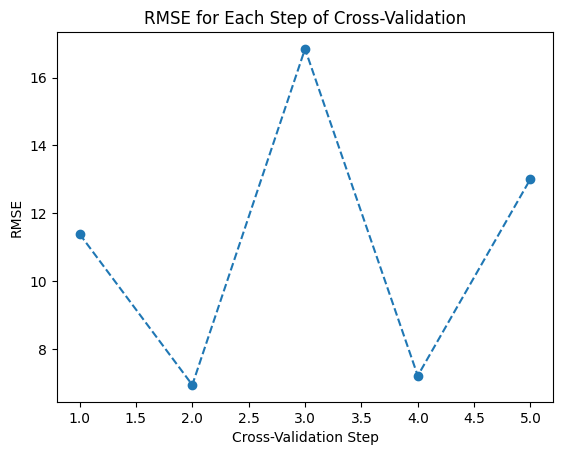

In [25]:
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt

omp_cv = OrthogonalMatchingPursuitCV()
omp_cv.fit(X_train, y_train)

# Perform cross-validation
cv_scores = cross_val_score(omp_cv, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = (-cv_scores) ** 0.5
print("Cross-Validation RMSE Scores:", cv_rmse_scores)
print("Mean Cross-Validation RMSE:", cv_rmse_scores.mean())

# Plot RMSE for each step of cross-validation
plt.plot(range(1, 6), cv_rmse_scores, marker='o', linestyle='--')
plt.xlabel('Cross-Validation Step')
plt.ylabel('RMSE')
plt.title('RMSE for Each Step of Cross-Validation')
plt.show()


In [26]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict on the test set using OrthogonalMatchingPursuitCV
y_pred_test_omp = omp_cv.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error, Mean Absolute Error)
mse_omp = mean_squared_error(y_test, y_pred_test_omp)
mae_omp = mean_absolute_error(y_test, y_pred_test_omp)

# Print the evaluation metrics for OrthogonalMatchingPursuitCV
print("Mean Squared Error (OMP):", mse_omp)
print("Mean Absolute Error (OMP):", mae_omp)


Mean Squared Error (OMP): 93.0584975518085
Mean Absolute Error (OMP): 5.96381788360729


In [27]:
# Predict on the validation set using OrthogonalMatchingPursuitCV
y_pred_val_omp = omp_cv.predict(X_val)

# Calculate evaluation metrics for validation set
mse_val_omp = mean_squared_error(y_val, y_pred_val_omp)
mae_val_omp = mean_absolute_error(y_val, y_pred_val_omp)

# Print the evaluation metrics for validation set using OrthogonalMatchingPursuitCV
print("Validation Mean Squared Error (OMP):", mse_val_omp)
print("Validation Mean Absolute Error (OMP):", mae_val_omp)


Validation Mean Squared Error (OMP): 97.56429451047366
Validation Mean Absolute Error (OMP): 5.329268170309265


In [28]:
import numpy as np

# Assuming X_train and X_test are pandas DataFrames
# Convert them to NumPy arrays using the to_numpy() method

X_train_np = X_train.to_numpy().reshape(-1, 1)  # Reshape X_train
X_test_np = X_test.to_numpy().reshape(-1, 1)     # Reshape X_test


Training error for 10 features: 106.21285849856045
Testing error for 10 features: 95.93632197371211
Training error for 50 features: 109.86912851847825
Testing error for 50 features: 93.0584975518085
Training error for 100 features: 109.86912851847825
Testing error for 100 features: 93.0584975518085
Training error for 150 features: 109.86912851847825
Testing error for 150 features: 93.0584975518085
Training error for 200 features: 109.86912851847825
Testing error for 200 features: 93.0584975518085


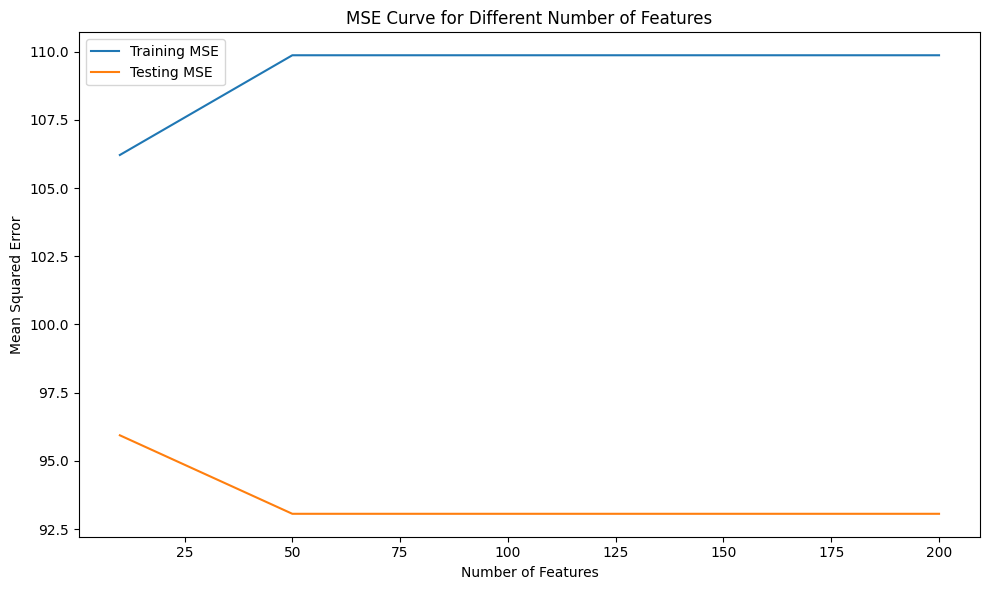

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Assuming X_train and X_test are pandas DataFrames, and y_train and y_test are NumPy arrays
# Convert X_train and X_test to NumPy arrays and reshape them
X_train_np = X_train.to_numpy()
X_test_np = X_test.to_numpy()

num_samples_train, num_features_train = X_train_np.shape
num_samples_test, num_features_test = X_test_np.shape

# Define a range of number of features (estimators)
num_features = [10, 50, 100, 150, 200]

train_errors = []
test_errors = []

# Create OrthogonalMatchingPursuitCV model
omp_cv = OrthogonalMatchingPursuitCV()

for n in num_features:
    # Train the OrthogonalMatchingPursuitCV model
    omp_cv.fit(X_train_np[:, :n], y_train)

    # Make predictions on the training and testing sets
    y_train_pred = omp_cv.predict(X_train_np[:, :n])
    y_test_pred = omp_cv.predict(X_test_np[:, :n])

    # Calculate the mean squared errors
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Append the errors to the lists
    train_errors.append(train_error)
    test_errors.append(test_error)

    # Debugging: Print out the errors
    print(f"Training error for {n} features:", train_error)
    print(f"Testing error for {n} features:", test_error)

# Plot the MSE curve
plt.figure(figsize=(10, 6))
plt.plot(num_features, train_errors, label='Training MSE')
plt.plot(num_features, test_errors, label='Testing MSE')
plt.title('MSE Curve for Different Number of Features')
plt.xlabel('Number of Features')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.tight_layout()
plt.show()


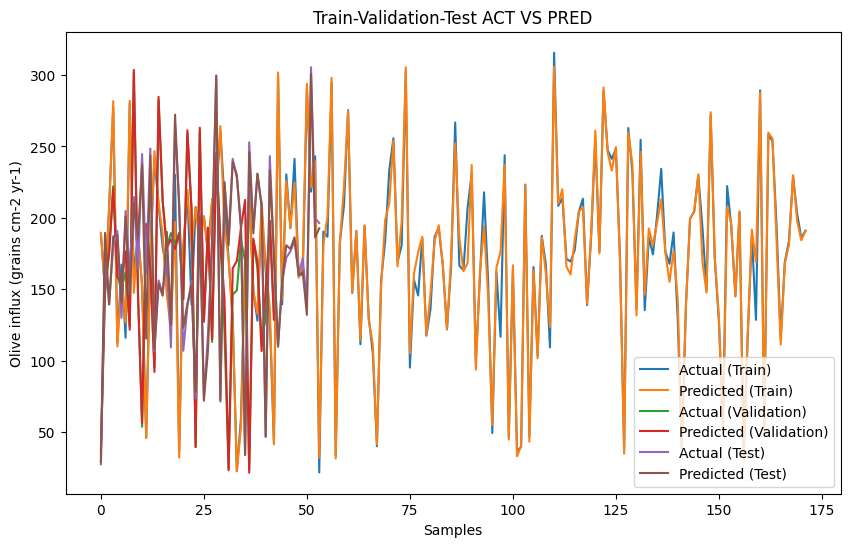

In [30]:
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Create OrthogonalMatchingPursuitCV model
omp_cv = OrthogonalMatchingPursuitCV()

# Fit the OrthogonalMatchingPursuitCV model to the training data
omp_cv.fit(X_train, y_train)

# Calculate the training set predictions
y_pred_train = omp_cv.predict(X_train)

# Calculate the training set mean squared error
mse_train = mean_squared_error(y_train, y_pred_train)

# Predict on the validation and test sets
y_pred_val = omp_cv.predict(X_val)
y_pred_test = omp_cv.predict(X_test)

# Plot the train-validation-test loss curves
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_train)), y_train, label='Actual (Train)')
plt.plot(range(len(y_pred_train)), y_pred_train, label='Predicted (Train)')
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val)), y_pred_val, label='Predicted (Validation)')
plt.plot(range(len(y_test)), y_test, label='Actual (Test)')
plt.plot(range(len(y_pred_test)), y_pred_test, label='Predicted (Test)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation-Test ACT VS PRED')
plt.legend()
plt.show()


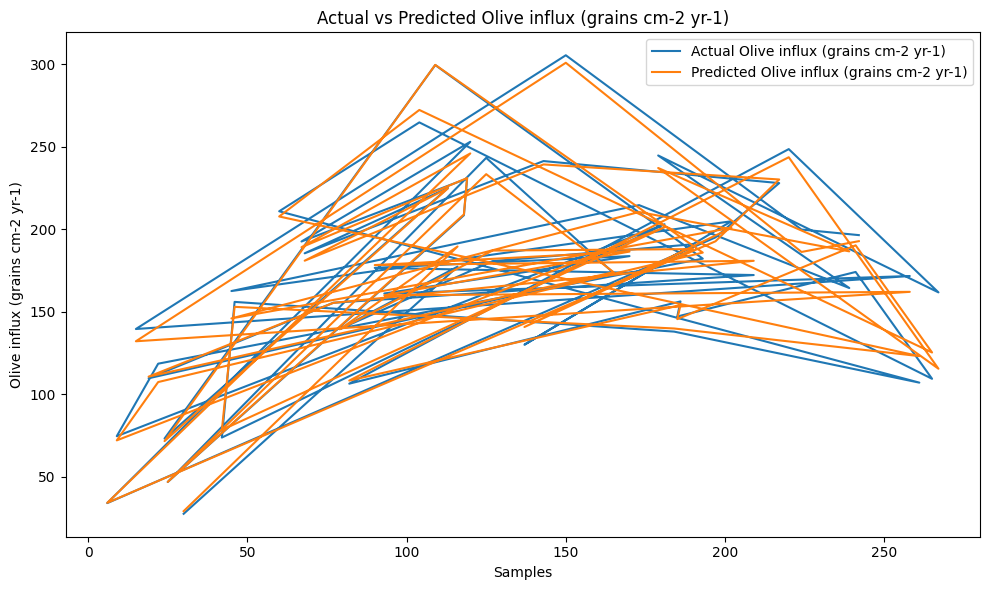

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import OrthogonalMatchingPursuitCV

# Assuming X_train, X_test, y_train, y_test are defined

# Create OrthogonalMatchingPursuitCV model
model = OrthogonalMatchingPursuitCV()

# Fit the model to the training data
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame with actual and predicted rent values
rent_comparison = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred})

# Plot the actual versus predicted rent values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.plot(rent_comparison.index, rent_comparison['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)')
plt.plot(rent_comparison.index, rent_comparison['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


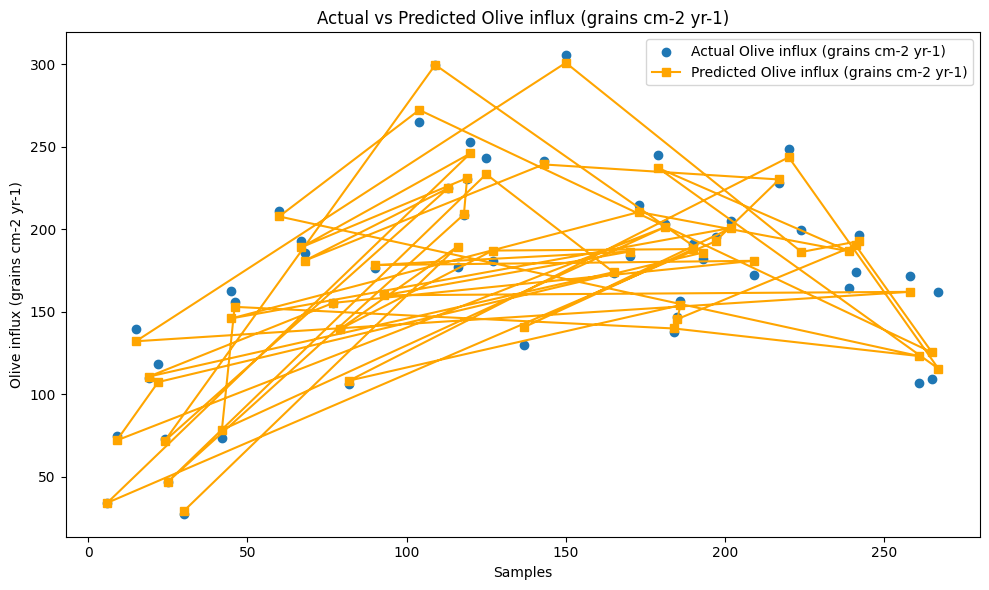

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import OrthogonalMatchingPursuitCV

# Assuming X_train, X_test, y_train, y_test are defined

# Create OrthogonalMatchingPursuitCV model
model = OrthogonalMatchingPursuitCV()

# Fit the model to the training data
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Create a DataFrame with actual and predicted rent values
rent_comparison = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred})

# Plot the actual versus predicted rent values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.scatter(rent_comparison.index, rent_comparison['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)', marker='o')
plt.plot(rent_comparison.index, rent_comparison['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


In [33]:
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Create and evaluate OrthogonalMatchingPursuitCV model
omp_cv = OrthogonalMatchingPursuitCV()
omp_cv.fit(X_train, y_train)
omp_pred = omp_cv.predict(X_test)

mae = mean_absolute_error(y_test, omp_pred)
mse = mean_squared_error(y_test, omp_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, omp_pred)
rmsle = np.sqrt(np.mean(np.log1p(omp_pred) - np.log1p(y_test)) ** 2)
mape = np.mean(np.abs((y_test - omp_pred) / y_test)) * 100

print(f"\nOrthogonal Matching Pursuit CV Model:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")



Orthogonal Matching Pursuit CV Model:
Mean Absolute Error (MAE): 5.96
Mean Squared Error (MSE): 93.06
Root Mean Squared Error (RMSE): 9.65
R-squared (R2): 0.97
Root Mean Squared Logarithmic Error (RMSLE): 0.00
Mean Absolute Percentage Error (MAPE): 3.85%


In [34]:
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define hyperparameters
cv_value = 5  # Example value, you can adjust this

# Create and evaluate OrthogonalMatchingPursuitCV model with hyperparameters
omp_cv = OrthogonalMatchingPursuitCV(cv=cv_value)
omp_cv.fit(X_train, y_train)
omp_pred = omp_cv.predict(X_test)

mae = mean_absolute_error(y_test, omp_pred)
mse = mean_squared_error(y_test, omp_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, omp_pred)
rmsle = np.sqrt(np.mean(np.log1p(omp_pred) - np.log1p(y_test)) ** 2)
mape = np.mean(np.abs((y_test - omp_pred) / y_test)) * 100

print(f"\nOrthogonal Matching Pursuit CV Model with Hyperparameters:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")



Orthogonal Matching Pursuit CV Model with Hyperparameters:
Mean Absolute Error (MAE): 5.96
Mean Squared Error (MSE): 93.06
Root Mean Squared Error (RMSE): 9.65
R-squared (R2): 0.97
Root Mean Squared Logarithmic Error (RMSLE): 0.00
Mean Absolute Percentage Error (MAPE): 3.85%


Cross-Validation RMSE Scores: [12.2512666  12.14827396 16.63363027 10.07721096 12.70554888]
Mean Cross-Validation RMSE: 12.76318613382968


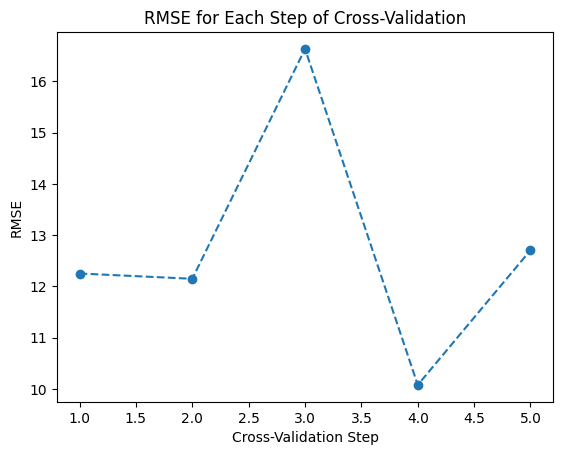

In [35]:
from sklearn.linear_model import LassoCV
import matplotlib.pyplot as plt

lasso_cv = LassoCV()
lasso_cv.fit(X_train, y_train)
cv_scores = cross_val_score(lasso_cv, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = (-cv_scores) ** 0.5
print("Cross-Validation RMSE Scores:", cv_rmse_scores)
print("Mean Cross-Validation RMSE:", cv_rmse_scores.mean())

# Plot RMSE for each step of cross-validation
plt.plot(range(1, 6), cv_rmse_scores, marker='o', linestyle='--')
plt.xlabel('Cross-Validation Step')
plt.ylabel('RMSE')
plt.title('RMSE for Each Step of Cross-Validation')
plt.show()


In [36]:
# Predict on the test set
y_pred_test = lasso_cv.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error, Mean Absolute Error)
mse = mean_squared_error(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

# Print the evaluation metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)


Mean Squared Error: 177.35934694414016
Mean Absolute Error: 8.984670539847137


In [37]:
# Predict on the validation set
y_pred_val = lasso_cv.predict(X_val)

# Calculate evaluation metrics for validation set
mse_val = mean_squared_error(y_val, y_pred_val)
mae_val = mean_absolute_error(y_val, y_pred_val)

# Print the evaluation metrics for validation set
print("Validation Mean Squared Error:", mse_val)
print("Validation Mean Absolute Error:", mae_val)


Validation Mean Squared Error: 145.0017847867458
Validation Mean Absolute Error: 7.723836558642635


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5819.016206318368, tolerance: 57.69048912757494
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6879.062170172506, tolerance: 54.140399391518606
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2859.8494395696152, tolerance: 56.80806596014874
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceW

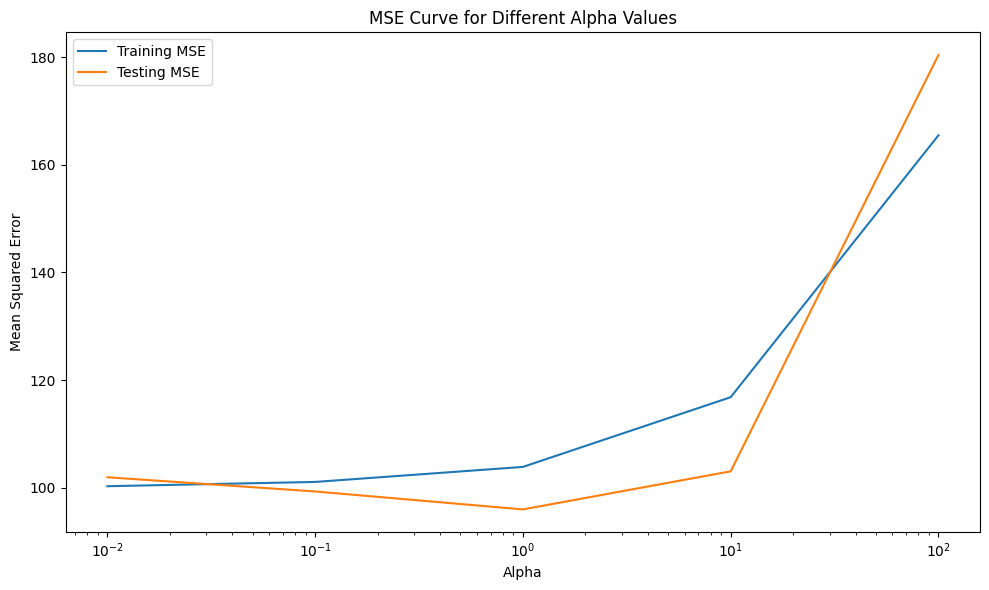

In [38]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Define a range of alphas
alphas = [0.01, 0.1, 1, 10, 100]

train_errors = []
test_errors = []

for alpha in alphas:
    # Train the Lasso regression model
    model = LassoCV(alphas=[alpha], cv=5)  # LassoCV automatically selects the best alpha through cross-validation
    model.fit(X_train, y_train)

    # Make predictions on the training and testing sets
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate the mean squared errors
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Append the errors to the lists
    train_errors.append(train_error)
    test_errors.append(test_error)

# Plot the MSE curve
plt.figure(figsize=(10, 6))
plt.plot(alphas, train_errors, label='Training MSE')
plt.plot(alphas, test_errors, label='Testing MSE')
plt.title('MSE Curve for Different Alpha Values')
plt.xlabel('Alpha')
plt.ylabel('Mean Squared Error')
plt.xscale('log')  # Since alphas are on a logarithmic scale
plt.legend()
plt.tight_layout()
plt.show()


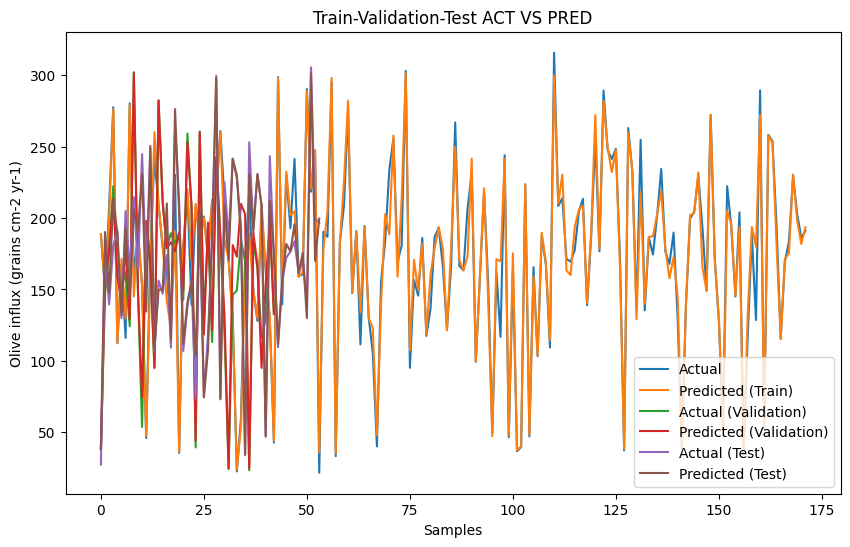

In [39]:
# Calculate the training set predictions
y_pred_train = lasso_cv.predict(X_train)

# Calculate the training set mean squared error
mse_train = mean_squared_error(y_train, y_pred_train)

# Plot the train-validation-test loss curves
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_train)), y_train, label='Actual')
plt.plot(range(len(y_pred_train)), y_pred_train, label='Predicted (Train)')
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val)), y_pred_val, label='Predicted (Validation)')
plt.plot(range(len(y_test)), y_test, label='Actual (Test)')
plt.plot(range(len(y_pred_test)), y_pred_test, label='Predicted (Test)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation-Test ACT VS PRED')
plt.legend()
plt.show()


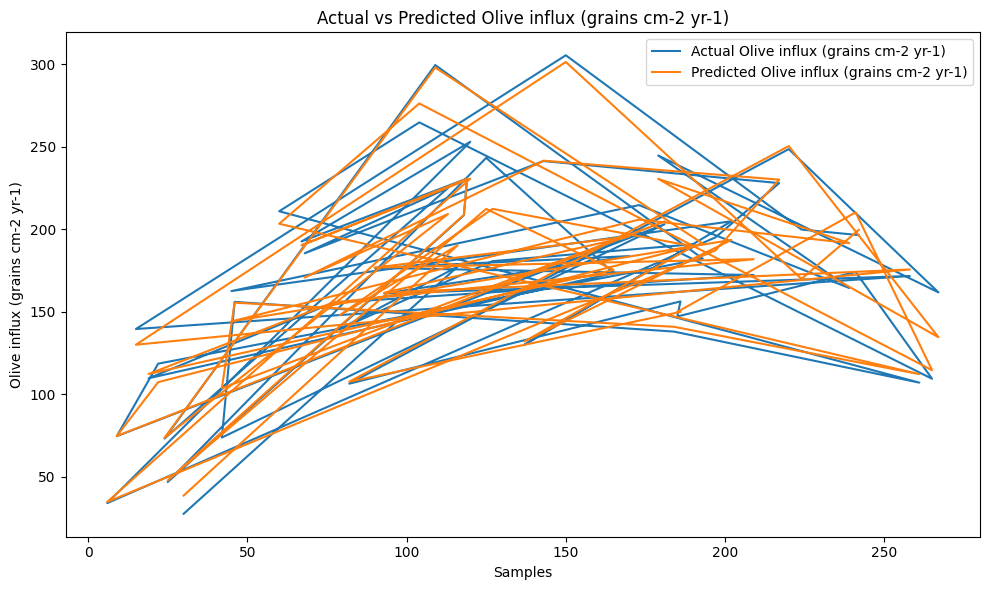

In [40]:
# Make predictions on the test set
y_pred = lasso_cv.predict(X_test)

# Create a DataFrame with actual and predicted rent values
rent_comparison = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred})

# Plot the actual versus predicted rent values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.plot(rent_comparison.index, rent_comparison['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)')
plt.plot(rent_comparison.index, rent_comparison['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


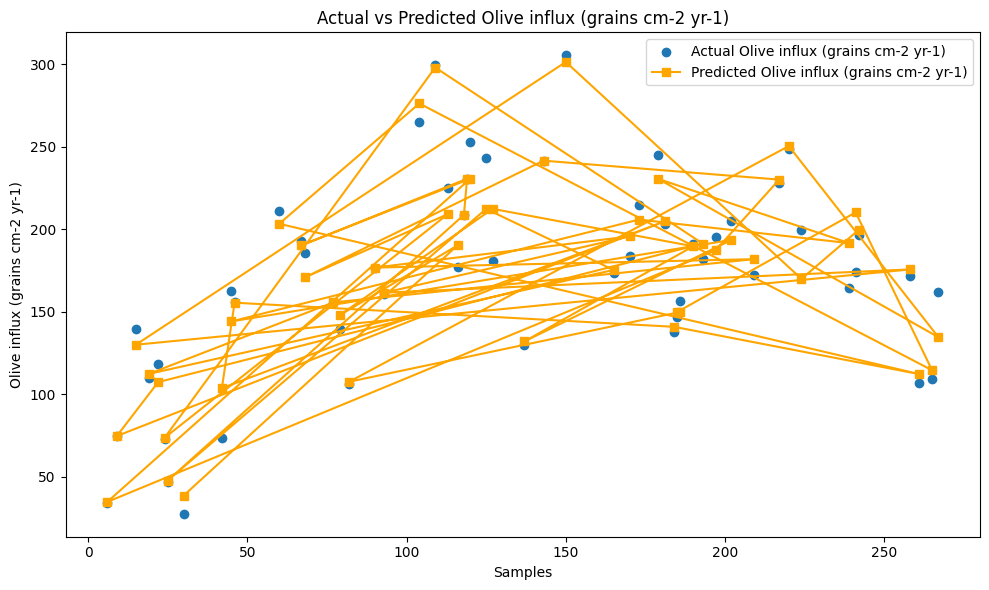

In [41]:
# Make predictions on the test set
y_pred = lasso_cv.predict(X_test)

# Create a DataFrame with actual and predicted rent values
rent_comparison = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred})

# Plot the actual versus predicted rent values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.scatter(rent_comparison.index, rent_comparison['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)', marker='o')
plt.plot(rent_comparison.index, rent_comparison['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


In [42]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define hyperparameters
cv_value = 5  # Example value, you can adjust this

# Create and evaluate LassoCV model with hyperparameters
lasso_cv = LassoCV(cv=cv_value)
lasso_cv.fit(X_train, y_train)
lasso_pred = lasso_cv.predict(X_test)

mae = mean_absolute_error(y_test, lasso_pred)
mse = mean_squared_error(y_test, lasso_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, lasso_pred)
rmsle = np.sqrt(np.mean(np.log1p(lasso_pred) - np.log1p(y_test)) ** 2)
mape = np.mean(np.abs((y_test - lasso_pred) / y_test)) * 100

print(f"\nLassoCV Model with Hyperparameters:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")



LassoCV Model with Hyperparameters:
Mean Absolute Error (MAE): 8.98
Mean Squared Error (MSE): 177.36
Root Mean Squared Error (RMSE): 13.32
R-squared (R2): 0.95
Root Mean Squared Logarithmic Error (RMSLE): 0.01
Mean Absolute Percentage Error (MAPE): 6.09%


Cross-Validation RMSE Scores: [10.87429434  7.21487531 16.39743942  6.76742225 10.99283149]
Mean Cross-Validation RMSE: 10.449372561076306


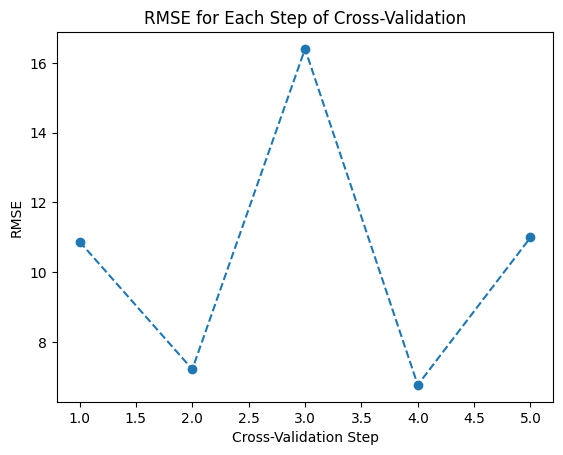

In [43]:
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have X_train and y_train defined somewhere before

bayesian_regressor = BayesianRidge()
bayesian_regressor.fit(X_train, y_train)
cv_scores = cross_val_score(bayesian_regressor, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(-cv_scores)
print("Cross-Validation RMSE Scores:", cv_rmse_scores)
print("Mean Cross-Validation RMSE:", cv_rmse_scores.mean())

# Plot RMSE for each step of cross-validation
plt.plot(range(1, 6), cv_rmse_scores, marker='o', linestyle='--')
plt.xlabel('Cross-Validation Step')
plt.ylabel('RMSE')
plt.title('RMSE for Each Step of Cross-Validation')
plt.show()


In [44]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict on the test set using Bayesian Ridge Regression
y_pred_test_bayesian = bayesian_regressor.predict(X_test)

# Calculate evaluation metrics (e.g., Mean Squared Error, Mean Absolute Error)
mse_bayesian = mean_squared_error(y_test, y_pred_test_bayesian)
mae_bayesian = mean_absolute_error(y_test, y_pred_test_bayesian)

# Print the evaluation metrics
print("Mean Squared Error (Bayesian Ridge):", mse_bayesian)
print("Mean Absolute Error (Bayesian Ridge):", mae_bayesian)


Mean Squared Error (Bayesian Ridge): 96.81836895083474
Mean Absolute Error (Bayesian Ridge): 5.668096316238222


In [45]:
# Predict on the validation set using Bayesian Ridge Regression
y_pred_val_bayesian = bayesian_regressor.predict(X_val)

# Calculate evaluation metrics for validation set
mse_val_bayesian = mean_squared_error(y_val, y_pred_val_bayesian)
mae_val_bayesian = mean_absolute_error(y_val, y_pred_val_bayesian)

# Print the evaluation metrics for validation set
print("Validation Mean Squared Error (Bayesian Ridge):", mse_val_bayesian)
print("Validation Mean Absolute Error (Bayesian Ridge):", mae_val_bayesian)


Validation Mean Squared Error (Bayesian Ridge): 101.99174387392979
Validation Mean Absolute Error (Bayesian Ridge): 5.840191149223863


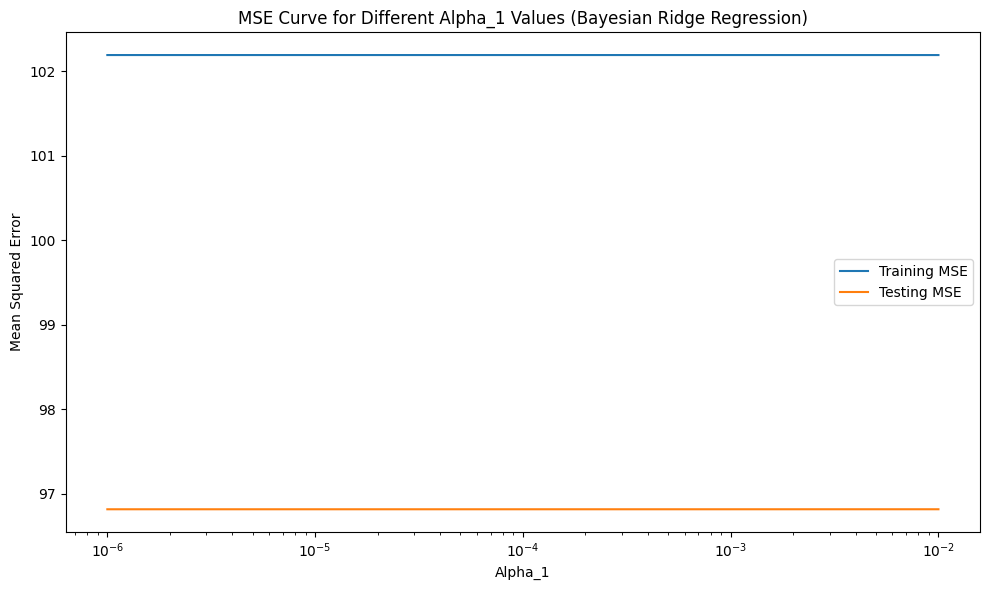

In [46]:
import matplotlib.pyplot as plt
from sklearn.linear_model import BayesianRidge
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Define a range of alpha_1 values
alpha_1_values = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]

train_errors = []
test_errors = []

for alpha_1 in alpha_1_values:
    # Train the Bayesian Ridge regression model
    model = BayesianRidge(alpha_1=alpha_1)
    model.fit(X_train, y_train)

    # Make predictions on the training and testing sets
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate the mean squared errors
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    # Append the errors to the lists
    train_errors.append(train_error)
    test_errors.append(test_error)

# Plot the MSE curve
plt.figure(figsize=(10, 6))
plt.plot(alpha_1_values, train_errors, label='Training MSE')
plt.plot(alpha_1_values, test_errors, label='Testing MSE')
plt.title('MSE Curve for Different Alpha_1 Values (Bayesian Ridge Regression)')
plt.xlabel('Alpha_1')
plt.ylabel('Mean Squared Error')
plt.xscale('log')  # Use log scale for better visualization if values vary widely
plt.legend()
plt.tight_layout()
plt.show()


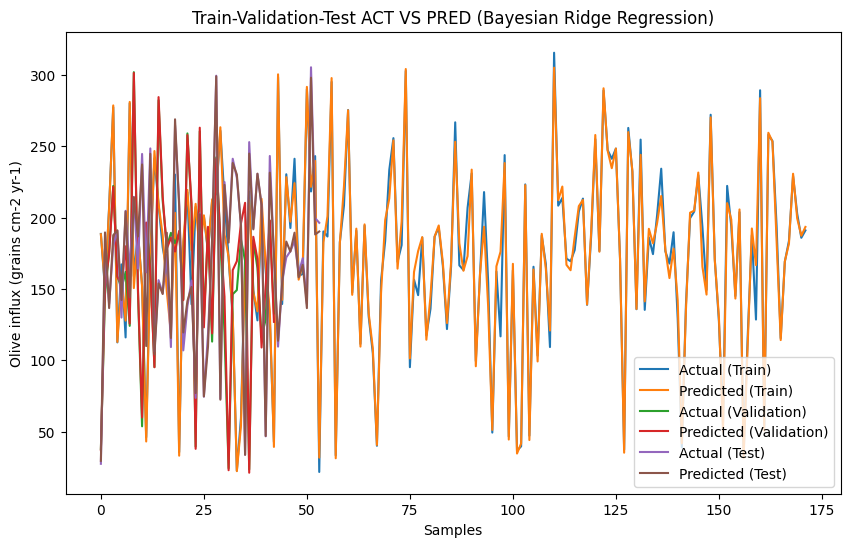

In [47]:
# Calculate the training set predictions using Bayesian Ridge Regression
y_pred_train_bayesian = bayesian_regressor.predict(X_train)

# Calculate the training set mean squared error for Bayesian Ridge Regression
mse_train_bayesian = mean_squared_error(y_train, y_pred_train_bayesian)

# Calculate the validation set predictions using Bayesian Ridge Regression
y_pred_val_bayesian = bayesian_regressor.predict(X_val)

# Plot the train-validation-test loss curves
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_train)), y_train, label='Actual (Train)')
plt.plot(range(len(y_pred_train_bayesian)), y_pred_train_bayesian, label='Predicted (Train)')
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val_bayesian)), y_pred_val_bayesian, label='Predicted (Validation)')
plt.plot(range(len(y_test)), y_test, label='Actual (Test)')
plt.plot(range(len(y_pred_test_bayesian)), y_pred_test_bayesian, label='Predicted (Test)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation-Test ACT VS PRED (Bayesian Ridge Regression)')
plt.legend()
plt.show()


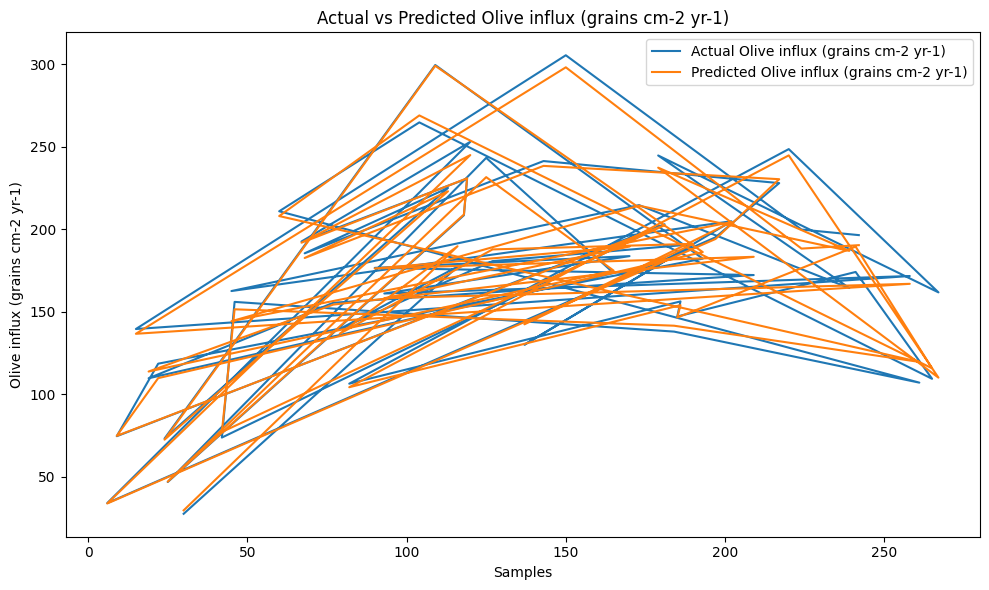

In [48]:
import pandas as pd
import matplotlib.pyplot as plt

# Make predictions on the test set using Bayesian Ridge Regression
y_pred_bayesian = bayesian_regressor.predict(X_test)

# Create a DataFrame with actual and predicted olive influx values
rent_comparison_bayesian = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred_bayesian})

# Plot the actual versus predicted olive influx values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.plot(rent_comparison_bayesian.index, rent_comparison_bayesian['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)')
plt.plot(rent_comparison_bayesian.index, rent_comparison_bayesian['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()



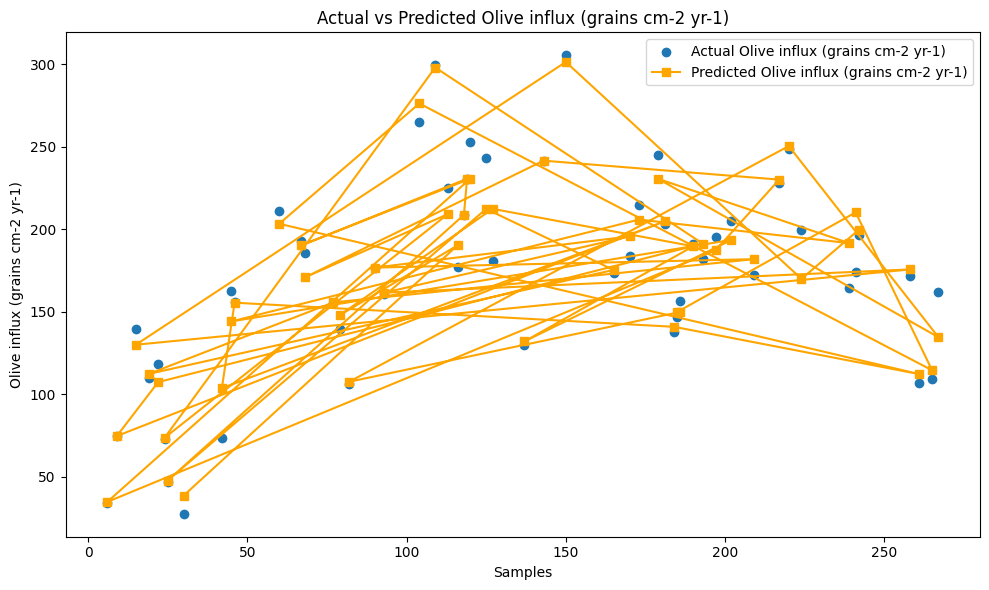

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Make predictions on the test set using Huber Regression
y_pred_bayesian = bayesian_regressor.predict(X_test)

# Create a DataFrame with actual and predicted olive influx values
rent_comparison = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred})

# Plot the actual versus predicted olive influx values
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1)")
plt.scatter(rent_comparison.index, rent_comparison['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)', marker='o')
plt.plot(rent_comparison.index, rent_comparison['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


In [50]:
from sklearn.linear_model import BayesianRidge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define hyperparameters
alpha_1_value = 1e-6  # Example value, you can adjust this

# Create and evaluate BayesianRidge model with hyperparameters
bayesian_reg = BayesianRidge(alpha_1=alpha_1_value)
bayesian_reg.fit(X_train, y_train)
bayesian_pred = bayesian_reg.predict(X_test)

mae = mean_absolute_error(y_test, bayesian_pred)
mse = mean_squared_error(y_test, bayesian_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, bayesian_pred)
rmsle = np.sqrt(np.mean(np.log1p(bayesian_pred) - np.log1p(y_test)) ** 2)
mape = np.mean(np.abs((y_test - bayesian_pred) / y_test)) * 100

print("\nBayesian Ridge Regressor Model with Hyperparameters:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")



Bayesian Ridge Regressor Model with Hyperparameters:
Mean Absolute Error (MAE): 5.67
Mean Squared Error (MSE): 96.82
Root Mean Squared Error (RMSE): 9.84
R-squared (R2): 0.97
Root Mean Squared Logarithmic Error (RMSLE): 0.00
Mean Absolute Percentage Error (MAPE): 3.60%


**Ensemble Model**

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_

Huber Regression Cross-Validation RMSE Scores: [10.25676776  6.6272843  16.82194859  6.93258678 10.67902147]
Mean Huber Regression Cross-Validation RMSE: 10.26352178098124
Bayesian Ridge Regression Cross-Validation RMSE Scores: [10.87429434  7.21487531 16.39743942  6.76742225 10.99283149]
Mean Bayesian Ridge Regression Cross-Validation RMSE: 10.449372561076306
Ensemble Cross-Validation RMSE Scores: [10.56553105  6.92107981 16.609694    6.85000452 10.83592648]
Mean Ensemble Cross-Validation RMSE: 10.356447171028773


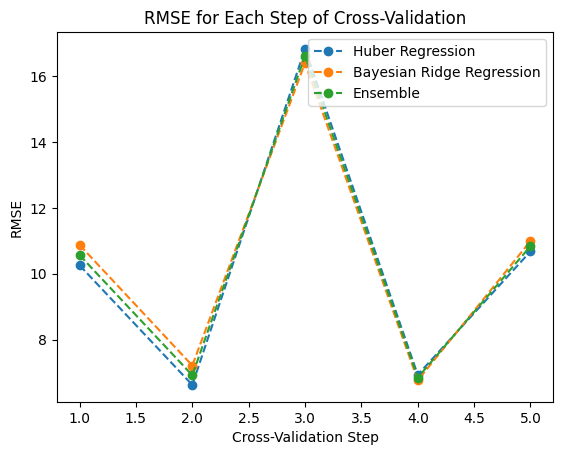

In [51]:
from sklearn.linear_model import HuberRegressor, BayesianRidge
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt

# Huber Regression model
huber_reg = HuberRegressor()
huber_reg.fit(X_train, y_train)
cv_scores_huber = cross_val_score(huber_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores_huber = (-cv_scores_huber) ** 0.5
print("Huber Regression Cross-Validation RMSE Scores:", cv_rmse_scores_huber)
print("Mean Huber Regression Cross-Validation RMSE:", cv_rmse_scores_huber.mean())

# Bayesian Ridge Regression model
bayesian_ridge = BayesianRidge()
bayesian_ridge.fit(X_train, y_train)
cv_scores_bayesian_ridge = cross_val_score(bayesian_ridge, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores_bayesian_ridge = (-cv_scores_bayesian_ridge) ** 0.5
print("Bayesian Ridge Regression Cross-Validation RMSE Scores:", cv_rmse_scores_bayesian_ridge)
print("Mean Bayesian Ridge Regression Cross-Validation RMSE:", cv_rmse_scores_bayesian_ridge.mean())

# Ensemble of Huber Regression and Bayesian Ridge Regression
ensemble_rmse_scores = np.mean([cv_rmse_scores_huber, cv_rmse_scores_bayesian_ridge], axis=0)
print("Ensemble Cross-Validation RMSE Scores:", ensemble_rmse_scores)
print("Mean Ensemble Cross-Validation RMSE:", ensemble_rmse_scores.mean())

# Plot RMSE for each step of cross-validation
plt.plot(range(1, 6), cv_rmse_scores_huber, label='Huber Regression', marker='o', linestyle='--')
plt.plot(range(1, 6), cv_rmse_scores_bayesian_ridge, label='Bayesian Ridge Regression', marker='o', linestyle='--')
plt.plot(range(1, 6), ensemble_rmse_scores, label='Ensemble', marker='o', linestyle='--')
plt.xlabel('Cross-Validation Step')
plt.ylabel('RMSE')
plt.title('RMSE for Each Step of Cross-Validation')
plt.legend()
plt.show()


In [52]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predictions using Huber Regression model
y_pred_test_huber = huber_reg.predict(X_test)

# Predictions using Bayesian Ridge Regression model
y_pred_test_bayesian_ridge = bayesian_ridge.predict(X_test)

# Ensemble predictions
y_pred_test_ensemble = (y_pred_test_huber + y_pred_test_bayesian_ridge) / 2

# Calculate evaluation metrics for Huber Regression
mse_huber = mean_squared_error(y_test, y_pred_test_huber)
mae_huber = mean_absolute_error(y_test, y_pred_test_huber)

# Calculate evaluation metrics for Bayesian Ridge Regression
mse_bayesian_ridge = mean_squared_error(y_test, y_pred_test_bayesian_ridge)
mae_bayesian_ridge = mean_absolute_error(y_test, y_pred_test_bayesian_ridge)

# Calculate evaluation metrics for the ensemble
mse_ensemble = mean_squared_error(y_test, y_pred_test_ensemble)
mae_ensemble = mean_absolute_error(y_test, y_pred_test_ensemble)

# Print the evaluation metrics
print("Huber Regression Model:")
print("Mean Squared Error:", mse_huber)
print("Mean Absolute Error:", mae_huber)
print("\nBayesian Ridge Regression Model:")
print("Mean Squared Error:", mse_bayesian_ridge)
print("Mean Absolute Error:", mae_bayesian_ridge)
print("\nEnsemble Model:")
print("Mean Squared Error:", mse_ensemble)
print("Mean Absolute Error:", mae_ensemble)


Huber Regression Model:
Mean Squared Error: 96.57392803926763
Mean Absolute Error: 5.766088555151157

Bayesian Ridge Regression Model:
Mean Squared Error: 96.81836895083474
Mean Absolute Error: 5.668096316238222

Ensemble Model:
Mean Squared Error: 95.09854909266336
Mean Absolute Error: 5.66532035004759


In [53]:
# Predictions using Huber Regression model on the validation set
y_pred_val_huber = huber_reg.predict(X_val)

# Predictions using Bayesian Ridge Regression model on the validation set
y_pred_val_bayesian_ridge = bayesian_ridge.predict(X_val)

# Ensemble predictions on the validation set
y_pred_val_ensemble = (y_pred_val_huber + y_pred_val_bayesian_ridge) / 2

# Calculate evaluation metrics for Huber Regression on the validation set
mse_val_huber = mean_squared_error(y_val, y_pred_val_huber)
mae_val_huber = mean_absolute_error(y_val, y_pred_val_huber)

# Calculate evaluation metrics for Bayesian Ridge Regression on the validation set
mse_val_bayesian_ridge = mean_squared_error(y_val, y_pred_val_bayesian_ridge)
mae_val_bayesian_ridge = mean_absolute_error(y_val, y_pred_val_bayesian_ridge)

# Calculate evaluation metrics for the ensemble on the validation set
mse_val_ensemble = mean_squared_error(y_val, y_pred_val_ensemble)
mae_val_ensemble = mean_absolute_error(y_val, y_pred_val_ensemble)

# Print the evaluation metrics for validation set
print("Huber Regression Model - Validation Set:")
print("Validation Mean Squared Error:", mse_val_huber)
print("Validation Mean Absolute Error:", mae_val_huber)
print("\nBayesian Ridge Regression Model - Validation Set:")
print("Validation Mean Squared Error:", mse_val_bayesian_ridge)
print("Validation Mean Absolute Error:", mae_val_bayesian_ridge)
print("\nEnsemble Model - Validation Set:")
print("Validation Mean Squared Error:", mse_val_ensemble)
print("Validation Mean Absolute Error:", mae_val_ensemble)


Huber Regression Model - Validation Set:
Validation Mean Squared Error: 105.47305734753151
Validation Mean Absolute Error: 5.191942254212825

Bayesian Ridge Regression Model - Validation Set:
Validation Mean Squared Error: 101.99174387392979
Validation Mean Absolute Error: 5.840191149223863

Ensemble Model - Validation Set:
Validation Mean Squared Error: 102.67186975952131
Validation Mean Absolute Error: 5.3639936268678685


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_

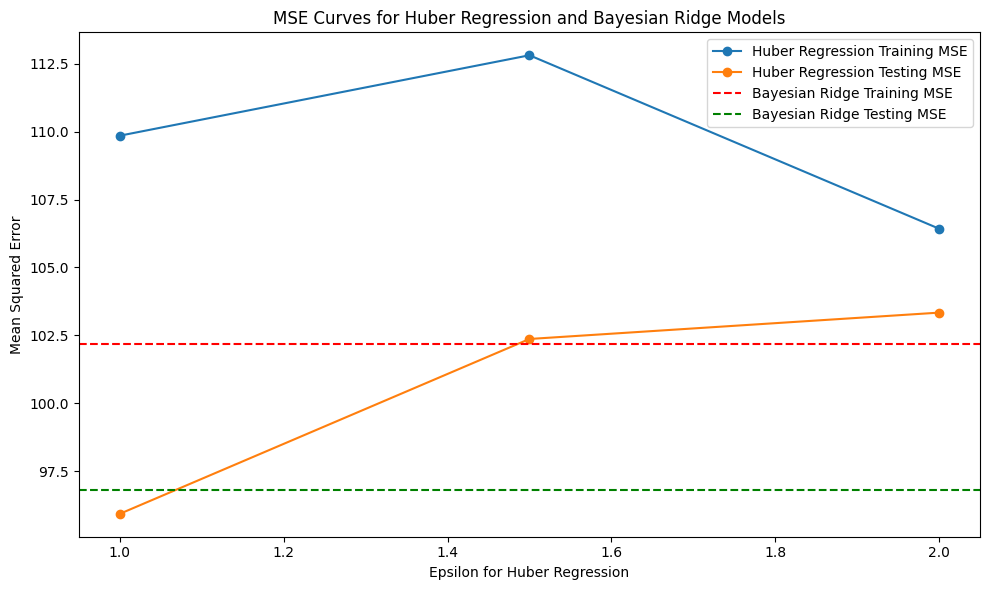

In [54]:
import matplotlib.pyplot as plt
from sklearn.linear_model import HuberRegressor, BayesianRidge
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Define a range of epsilon values for Huber Regression
epsilons = [1.0, 1.5, 2.0]

train_errors_huber = []
test_errors_huber = []

# Train Huber Regression model
for epsilon in epsilons:
    model_huber = HuberRegressor(epsilon=epsilon)
    model_huber.fit(X_train, y_train)

    # Make predictions on the training and testing sets
    y_train_pred_huber = model_huber.predict(X_train)
    y_test_pred_huber = model_huber.predict(X_test)

    # Calculate the mean squared errors
    train_error_huber = mean_squared_error(y_train, y_train_pred_huber)
    test_error_huber = mean_squared_error(y_test, y_test_pred_huber)

    # Append the errors to the lists
    train_errors_huber.append(train_error_huber)
    test_errors_huber.append(test_error_huber)

# Train Bayesian Ridge Regression model
model_bayesian_ridge = BayesianRidge()
model_bayesian_ridge.fit(X_train, y_train)

# Make predictions on the training and testing sets
y_train_pred_bayesian_ridge = model_bayesian_ridge.predict(X_train)
y_test_pred_bayesian_ridge = model_bayesian_ridge.predict(X_test)

# Calculate the mean squared errors for Bayesian Ridge Regression
train_error_bayesian_ridge = mean_squared_error(y_train, y_train_pred_bayesian_ridge)
test_error_bayesian_ridge = mean_squared_error(y_test, y_test_pred_bayesian_ridge)

# Plot the MSE curves for Huber Regression and Bayesian Ridge Regression
plt.figure(figsize=(10, 6))

plt.plot(epsilons, train_errors_huber, label='Huber Regression Training MSE', marker='o')
plt.plot(epsilons, test_errors_huber, label='Huber Regression Testing MSE', marker='o')

plt.axhline(y=train_error_bayesian_ridge, color='r', linestyle='--', label='Bayesian Ridge Training MSE')
plt.axhline(y=test_error_bayesian_ridge, color='g', linestyle='--', label='Bayesian Ridge Testing MSE')

plt.title('MSE Curves for Huber Regression and Bayesian Ridge Models')
plt.xlabel('Epsilon for Huber Regression')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.tight_layout()
plt.show()


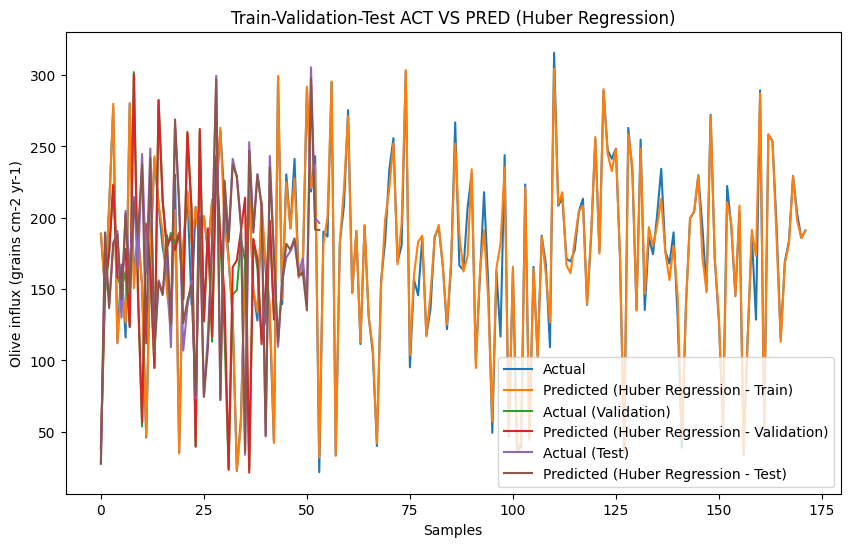

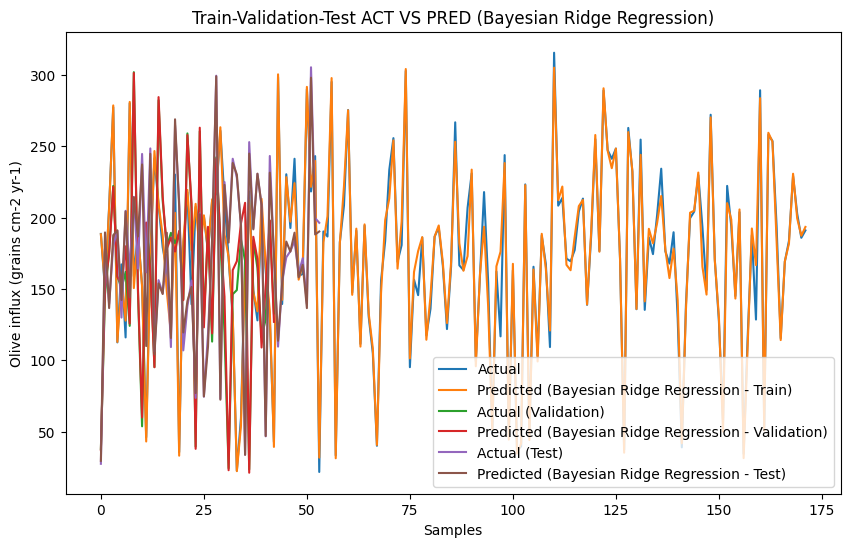

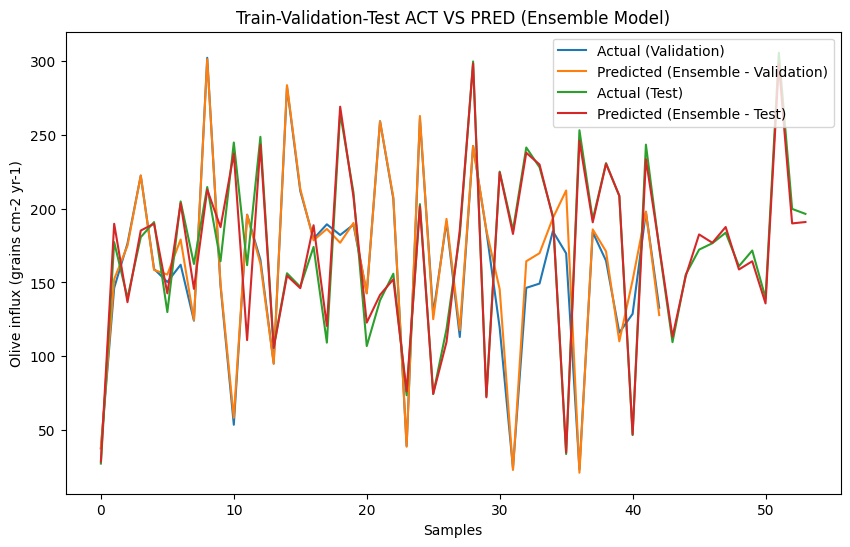

In [55]:
# Calculate the training set predictions for Huber Regression
y_pred_train_huber = huber_reg.predict(X_train)

# Calculate the training set predictions for Bayesian Ridge Regression
y_pred_train_bayesian_ridge = bayesian_ridge.predict(X_train)

# Plot the train-validation-test loss curves for Huber Regression
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_train)), y_train, label='Actual')
plt.plot(range(len(y_pred_train_huber)), y_pred_train_huber, label='Predicted (Huber Regression - Train)')
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val_huber)), y_pred_val_huber, label='Predicted (Huber Regression - Validation)')
plt.plot(range(len(y_test)), y_test, label='Actual (Test)')
plt.plot(range(len(y_pred_test_huber)), y_pred_test_huber, label='Predicted (Huber Regression - Test)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation-Test ACT VS PRED (Huber Regression)')
plt.legend()
plt.show()

# Plot the train-validation-test loss curves for Bayesian Ridge Regression
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_train)), y_train, label='Actual')
plt.plot(range(len(y_pred_train_bayesian_ridge)), y_pred_train_bayesian_ridge, label='Predicted (Bayesian Ridge Regression - Train)')
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val_bayesian_ridge)), y_pred_val_bayesian_ridge, label='Predicted (Bayesian Ridge Regression - Validation)')
plt.plot(range(len(y_test)), y_test, label='Actual (Test)')
plt.plot(range(len(y_pred_test_bayesian_ridge)), y_pred_test_bayesian_ridge, label='Predicted (Bayesian Ridge Regression - Test)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation-Test ACT VS PRED (Bayesian Ridge Regression)')
plt.legend()
plt.show()

# Calculate ensemble predictions on the validation and test sets
y_pred_val_ensemble = (y_pred_val_huber + y_pred_val_bayesian_ridge) / 2
y_pred_test_ensemble = (y_pred_test_huber + y_pred_test_bayesian_ridge) / 2

# Plot the train-validation-test loss curves for the ensemble model
plt.figure(figsize=(10, 6))
plt.plot(range(len(y_val)), y_val, label='Actual (Validation)')
plt.plot(range(len(y_pred_val_ensemble)), y_pred_val_ensemble, label='Predicted (Ensemble - Validation)')
plt.plot(range(len(y_test)), y_test, label='Actual (Test)')
plt.plot(range(len(y_pred_test_ensemble)), y_pred_test_ensemble, label='Predicted (Ensemble - Test)')
plt.xlabel('Samples')
plt.ylabel('Olive influx (grains cm-2 yr-1)')
plt.title('Train-Validation-Test ACT VS PRED (Ensemble Model)')
plt.legend()
plt.show()


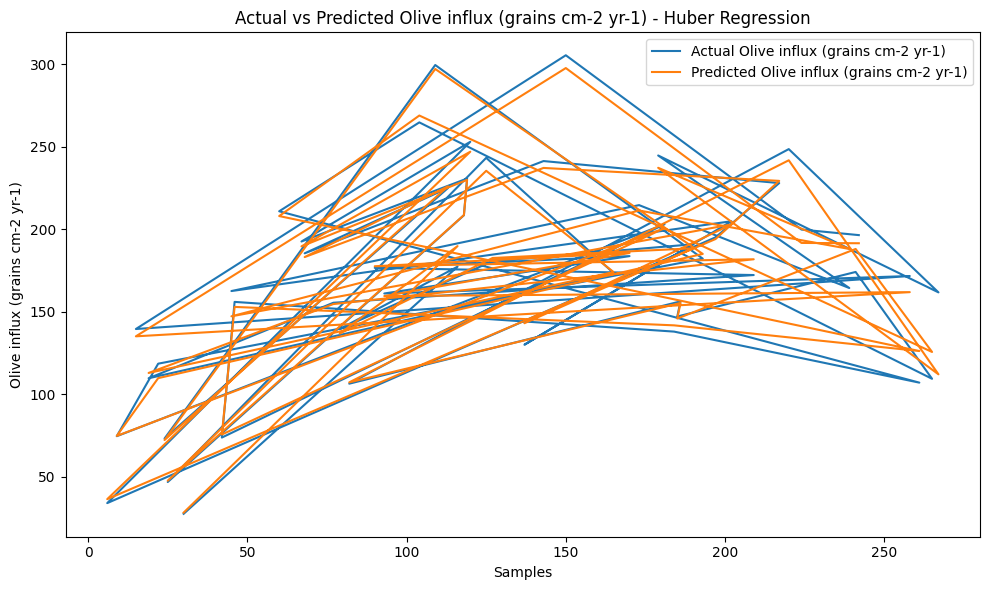

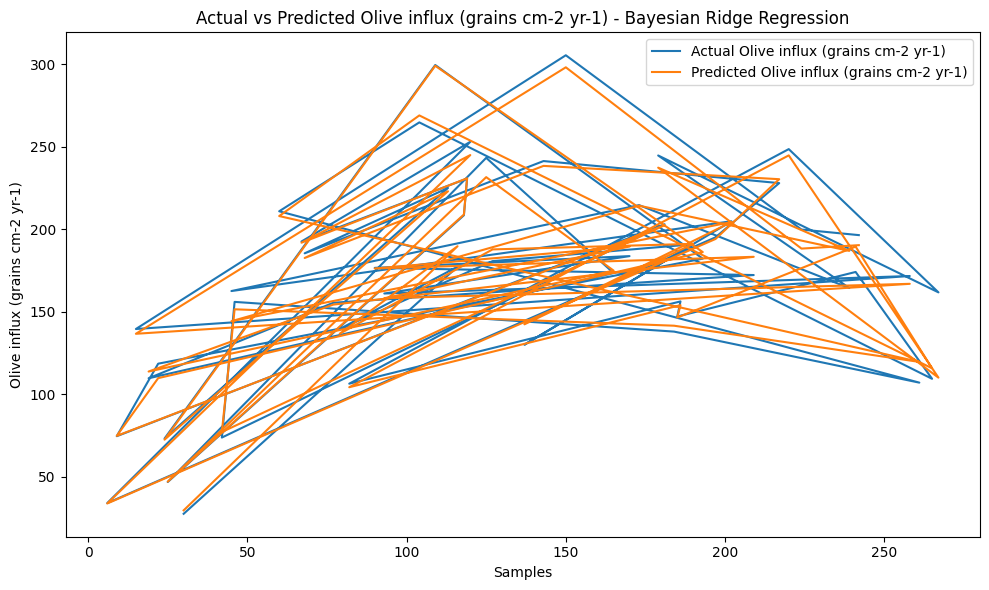

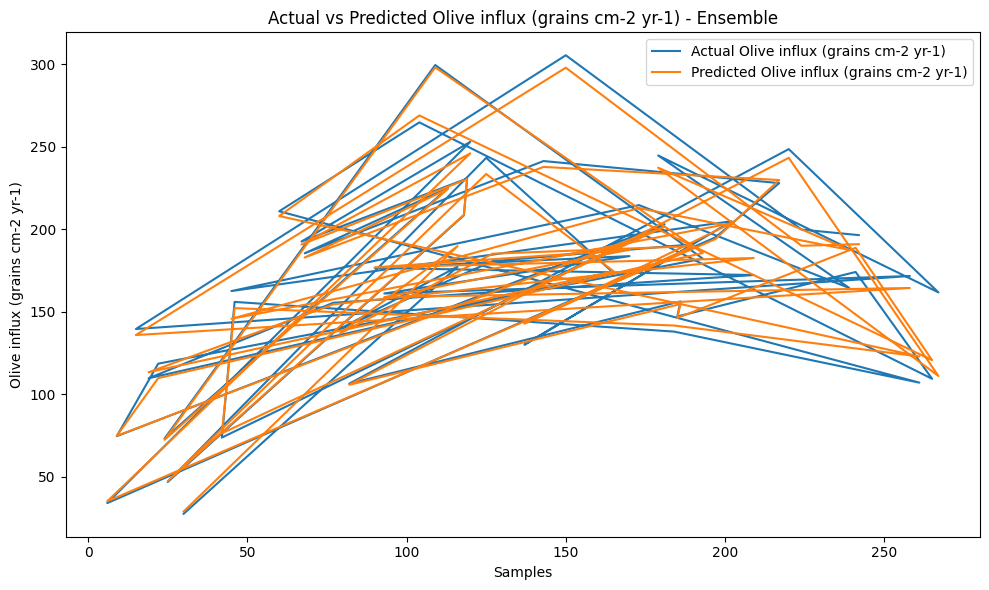

In [56]:
import pandas as pd
import matplotlib.pyplot as plt

# Make predictions on the test set for Huber Regression
y_pred_huber = huber_reg.predict(X_test)

# Make predictions on the test set for Bayesian Ridge Regression
y_pred_bayesian_ridge = bayesian_ridge.predict(X_test)

# Ensemble predictions
y_pred_ensemble = (y_pred_huber + y_pred_bayesian_ridge) / 2

# Create a DataFrame with actual and predicted olive influx values for Huber Regression
rent_comparison_huber = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred_huber})

# Create a DataFrame with actual and predicted olive influx values for Bayesian Ridge Regression
rent_comparison_bayesian_ridge = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred_bayesian_ridge})

# Create a DataFrame with actual and predicted olive influx values for the ensemble
rent_comparison_ensemble = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred_ensemble})

# Plot the actual versus predicted olive influx values for Huber Regression
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Huber Regression")
plt.plot(rent_comparison_huber.index, rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)')
plt.plot(rent_comparison_huber.index, rent_comparison_huber['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()

# Plot the actual versus predicted olive influx values for Bayesian Ridge Regression
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Bayesian Ridge Regression")
plt.plot(rent_comparison_bayesian_ridge.index, rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)')
plt.plot(rent_comparison_bayesian_ridge.index, rent_comparison_bayesian_ridge['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()

# Plot the actual versus predicted olive influx values for the ensemble
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Ensemble")
plt.plot(rent_comparison_ensemble.index, rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)')
plt.plot(rent_comparison_ensemble.index, rent_comparison_ensemble['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


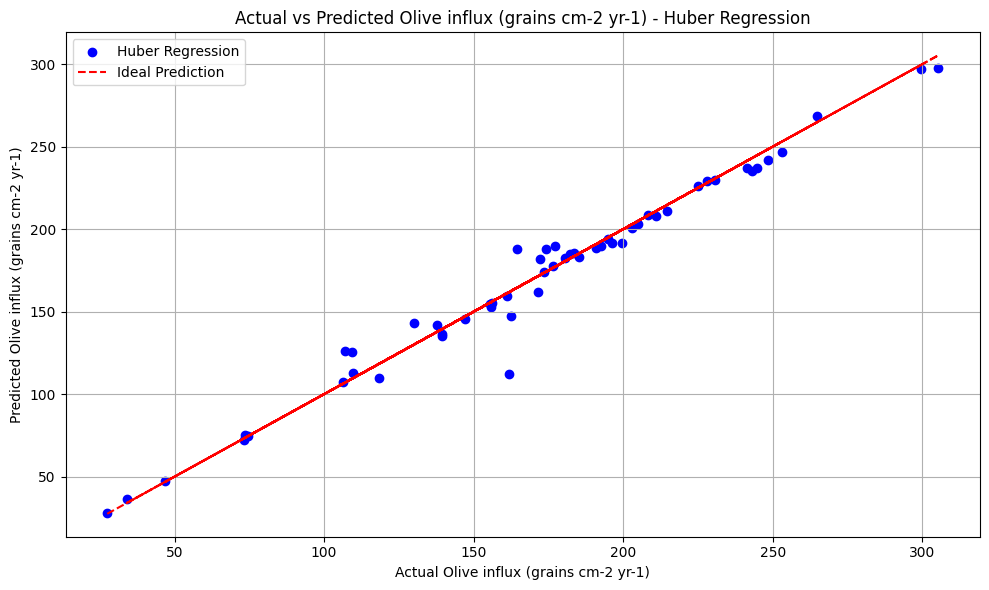

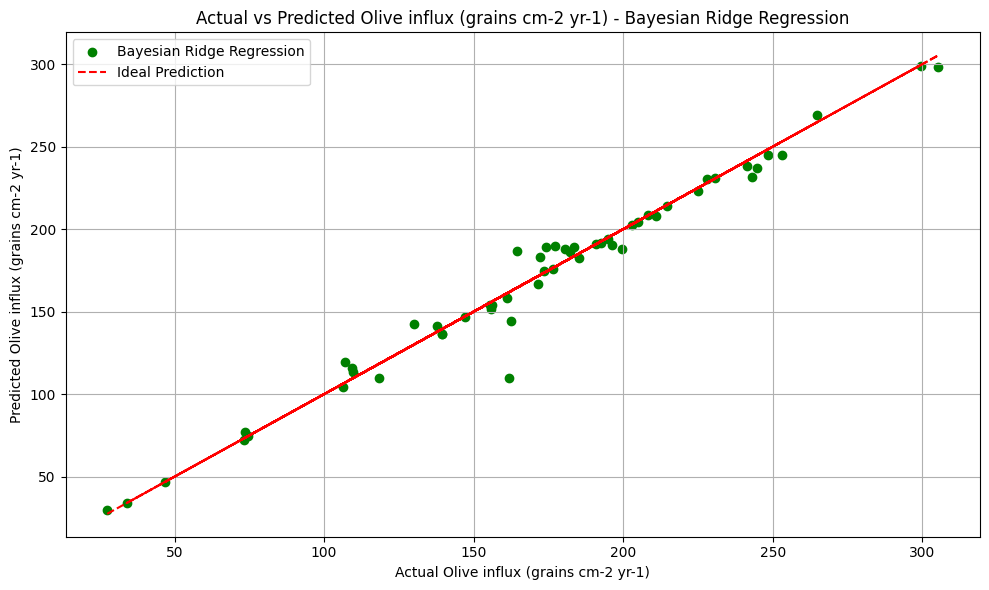

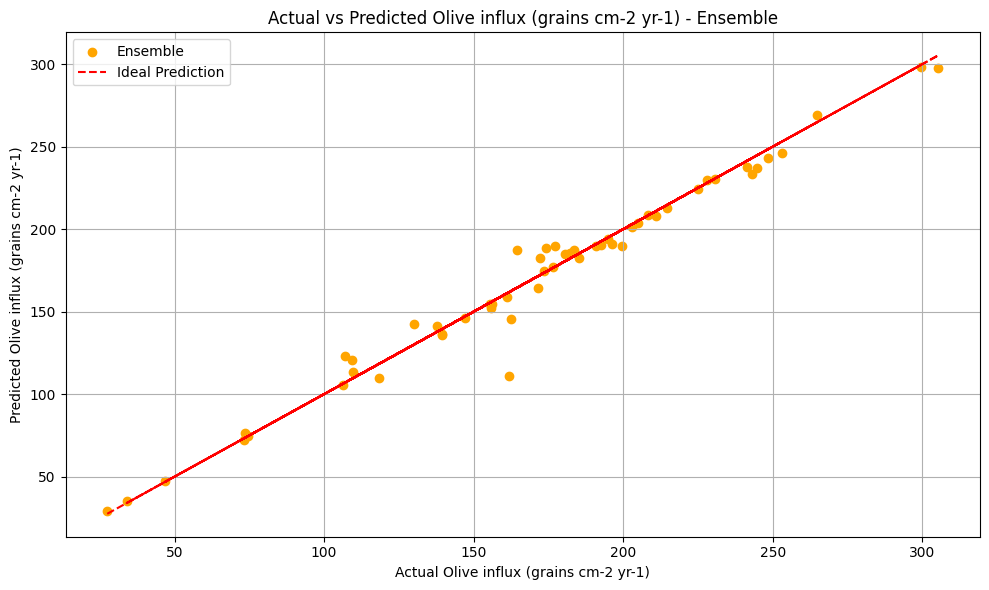

In [57]:
# Plotting for Huber Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Predicted Olive influx (grains cm-2 yr-1)'], c='blue', label='Huber Regression')
plt.plot(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Huber Regression")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting for Bayesian Ridge Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Predicted Olive influx (grains cm-2 yr-1)'], c='green', label='Bayesian Ridge Regression')
plt.plot(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Bayesian Ridge Regression")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting for Ensemble
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Predicted Olive influx (grains cm-2 yr-1)'], c='orange', label='Ensemble')
plt.plot(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Ensemble")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


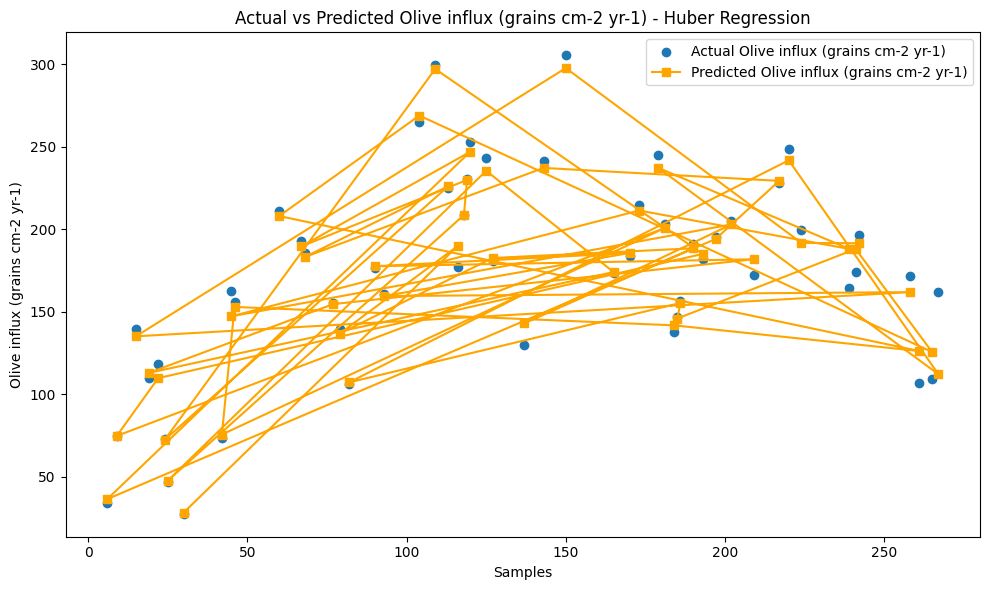

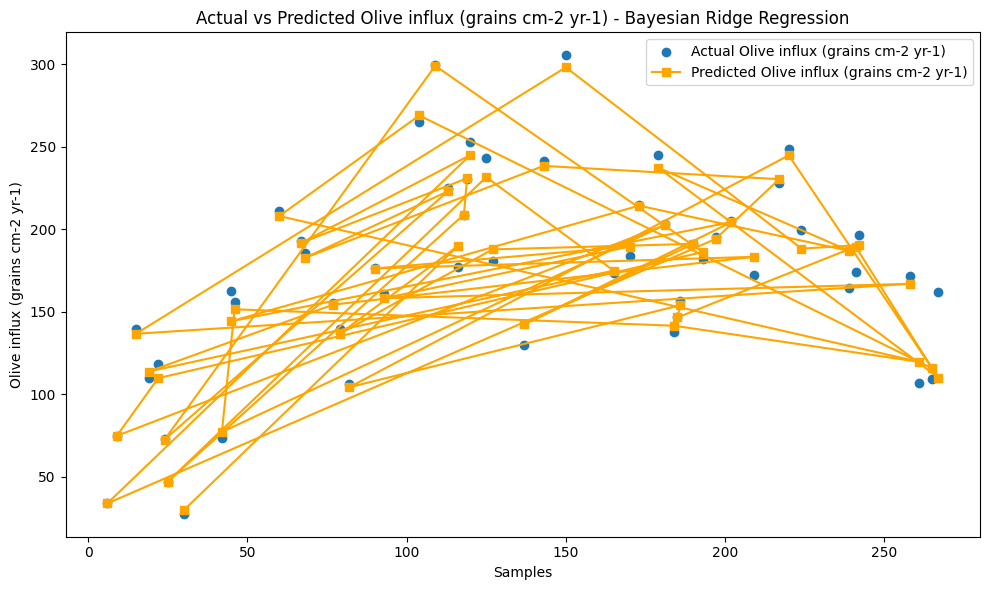

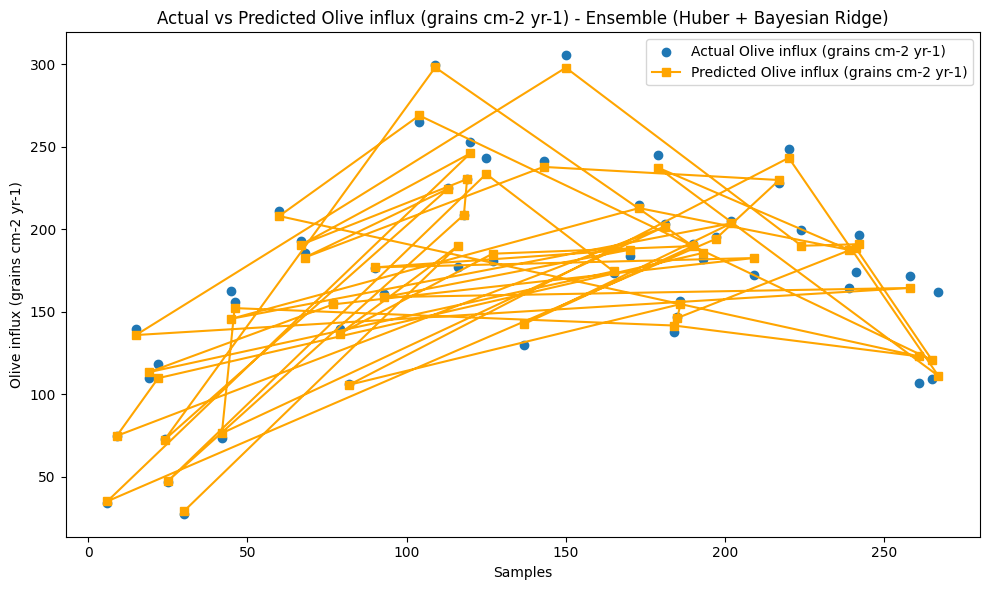

In [58]:
# Make predictions on the test set for Huber Regression
y_pred_huber = huber_reg.predict(X_test)

# Make predictions on the test set for Bayesian Ridge Regression
y_pred_bayesian_ridge = bayesian_ridge.predict(X_test)

# Ensemble predictions
y_pred_ensemble = (y_pred_huber + y_pred_bayesian_ridge) / 2

# Create a DataFrame with actual and predicted olive influx values for Huber Regression
rent_comparison_huber = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred_huber})

# Create a DataFrame with actual and predicted olive influx values for Bayesian Ridge Regression
rent_comparison_bayesian_ridge = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred_bayesian_ridge})

# Create a DataFrame with actual and predicted olive influx values for the ensemble
rent_comparison_ensemble = pd.DataFrame({'Actual Olive influx (grains cm-2 yr-1)': y_test, 'Predicted Olive influx (grains cm-2 yr-1)': y_pred_ensemble})

# Plot the actual versus predicted olive influx values for Huber Regression
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Huber Regression")
plt.scatter(rent_comparison_huber.index, rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)', marker='o')
plt.plot(rent_comparison_huber.index, rent_comparison_huber['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()

# Plot the actual versus predicted olive influx values for Bayesian Ridge Regression
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Bayesian Ridge Regression")
plt.scatter(rent_comparison_bayesian_ridge.index, rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)', marker='o')
plt.plot(rent_comparison_bayesian_ridge.index, rent_comparison_bayesian_ridge['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()

# Plot the actual versus predicted olive influx values for the ensemble
plt.figure(figsize=(10, 6))
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Ensemble (Huber + Bayesian Ridge)")
plt.scatter(rent_comparison_ensemble.index, rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], label='Actual Olive influx (grains cm-2 yr-1)', marker='o')
plt.plot(rent_comparison_ensemble.index, rent_comparison_ensemble['Predicted Olive influx (grains cm-2 yr-1)'], label='Predicted Olive influx (grains cm-2 yr-1)', linestyle='-', marker='s', color='orange')
plt.xlabel("Samples")
plt.ylabel("Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.tight_layout()
plt.show()


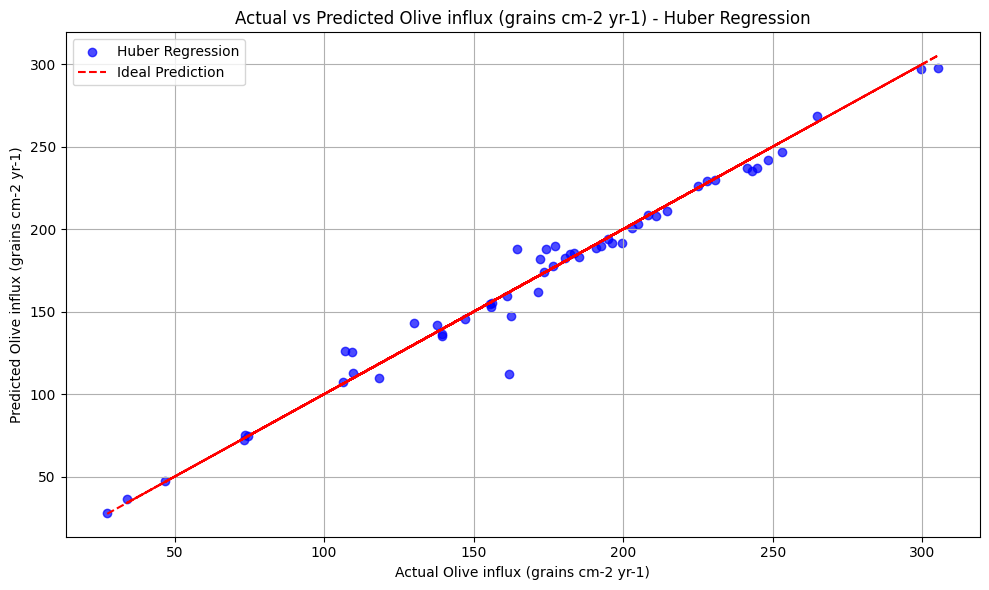

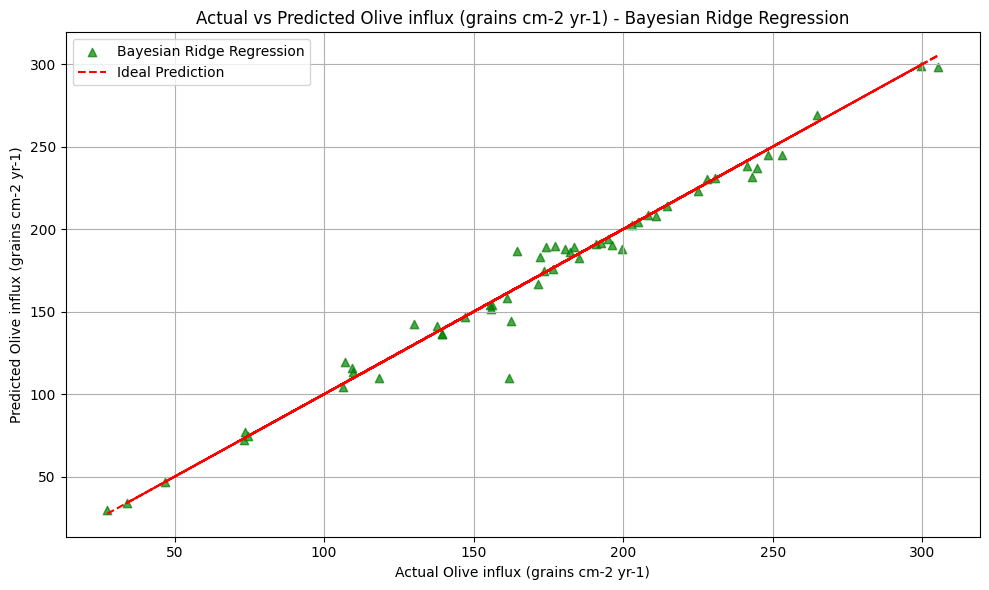

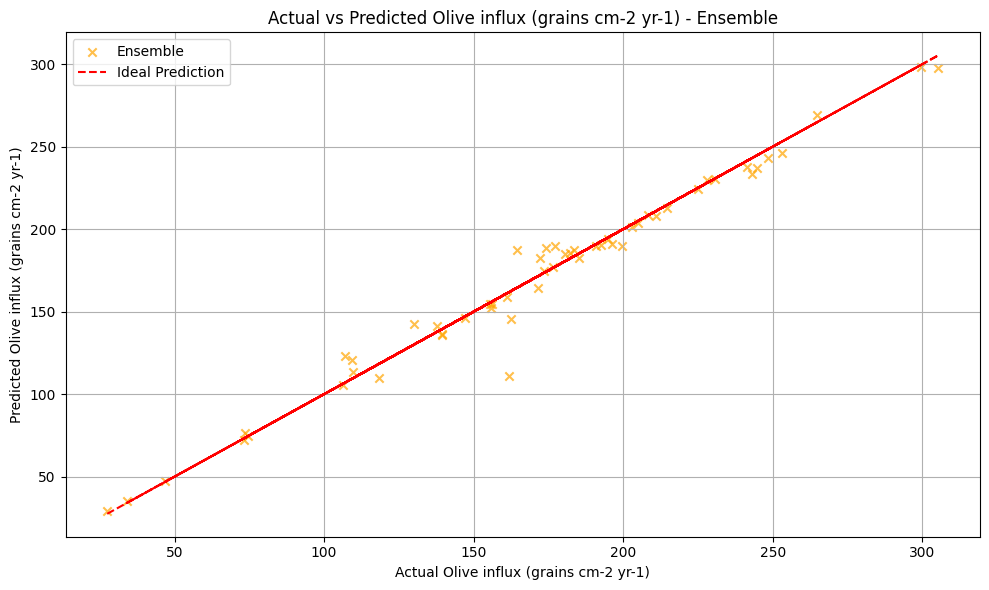

In [59]:
# Plotting for Huber Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Predicted Olive influx (grains cm-2 yr-1)'], c='blue', label='Huber Regression', marker='o', alpha=0.7)
plt.plot(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Huber Regression")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting for Bayesian Ridge Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Predicted Olive influx (grains cm-2 yr-1)'], c='green', label='Bayesian Ridge Regression', marker='^', alpha=0.7)
plt.plot(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Bayesian Ridge Regression")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting for Ensemble
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Predicted Olive influx (grains cm-2 yr-1)'], c='orange', label='Ensemble', marker='x', alpha=0.7)
plt.plot(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Ensemble")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


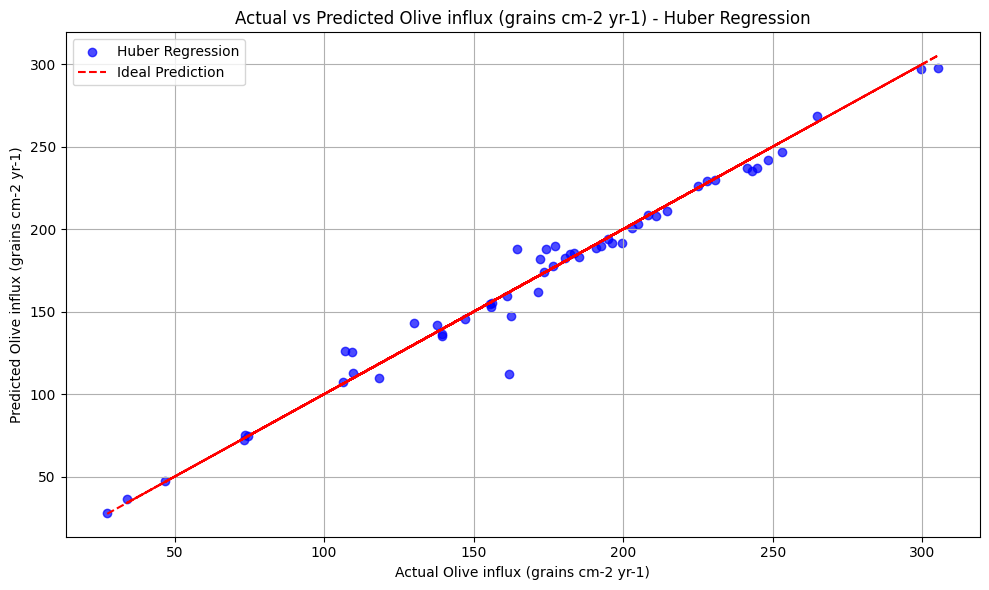

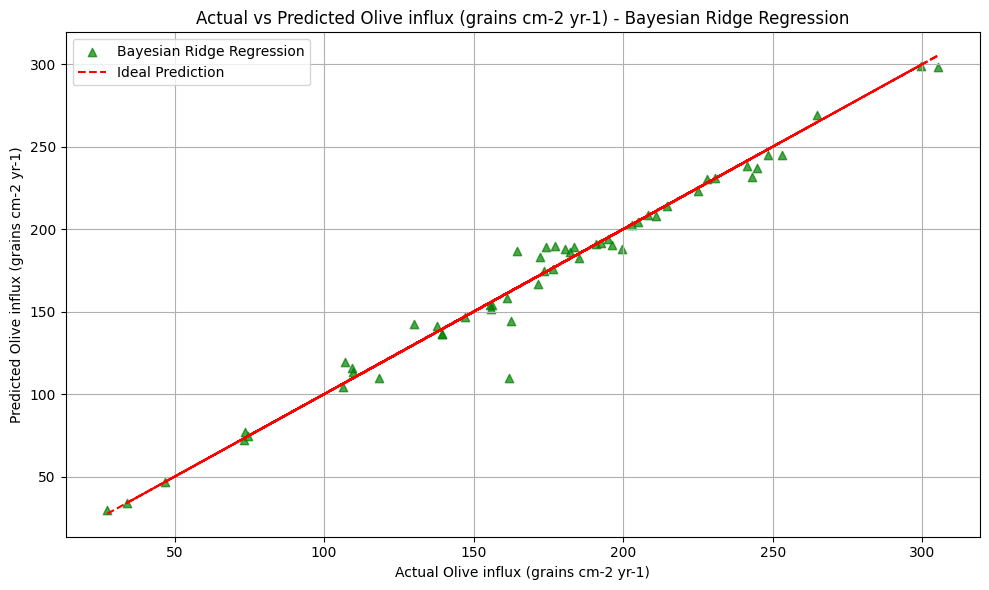

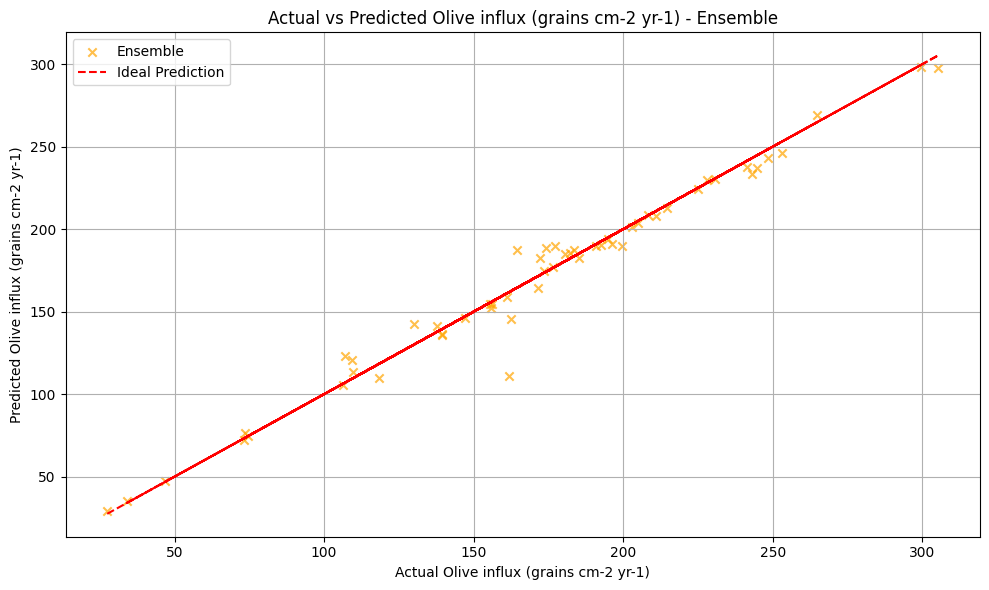

In [61]:
import matplotlib.pyplot as plt

# Plotting for Huber Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Predicted Olive influx (grains cm-2 yr-1)'], c='blue', label='Huber Regression', marker='o', alpha=0.7)
plt.plot(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Huber Regression")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('huber_regression_plot.pdf')  # Save as PDF
plt.show()

# Plotting for Bayesian Ridge Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Predicted Olive influx (grains cm-2 yr-1)'], c='green', label='Bayesian Ridge Regression', marker='^', alpha=0.7)
plt.plot(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Bayesian Ridge Regression")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('bayesian_ridge_regression_plot.pdf')  # Save as PDF
plt.show()

# Plotting for Ensemble
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Predicted Olive influx (grains cm-2 yr-1)'], c='orange', label='Ensemble', marker='x', alpha=0.7)
plt.plot(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Ensemble")
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)")
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('ensemble_plot.pdf')  # Save as PDF
plt.show()


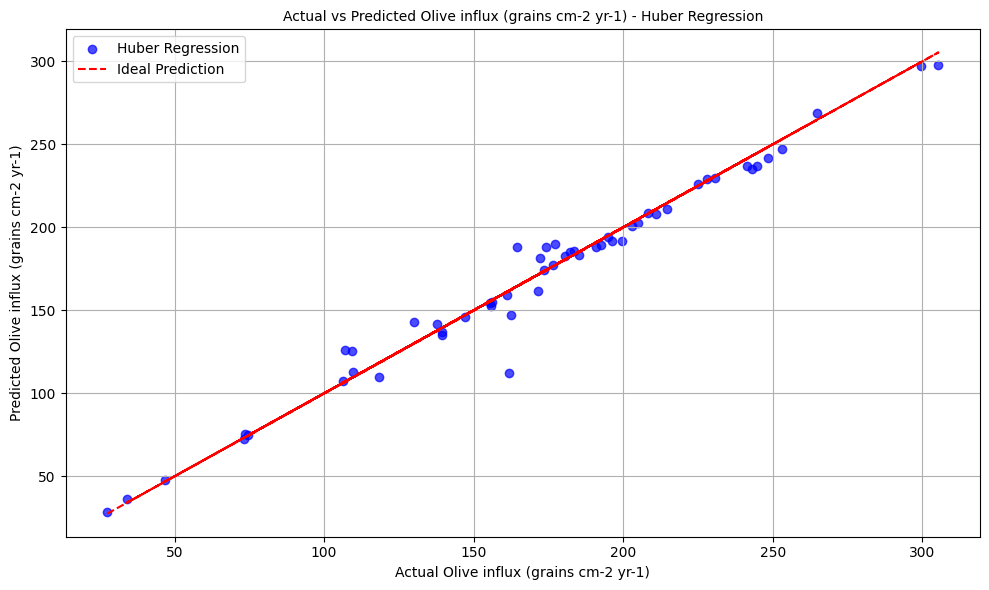

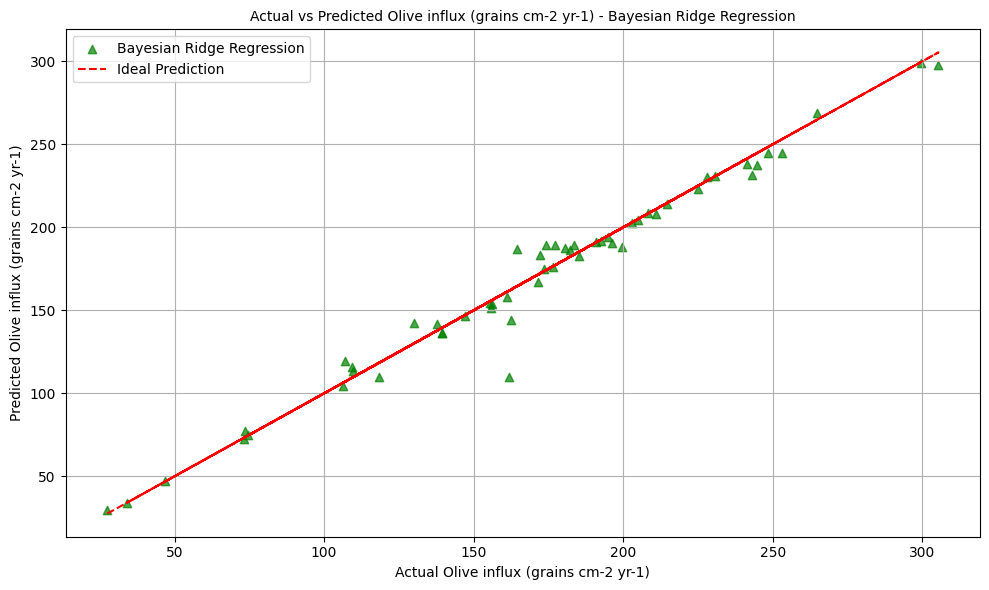

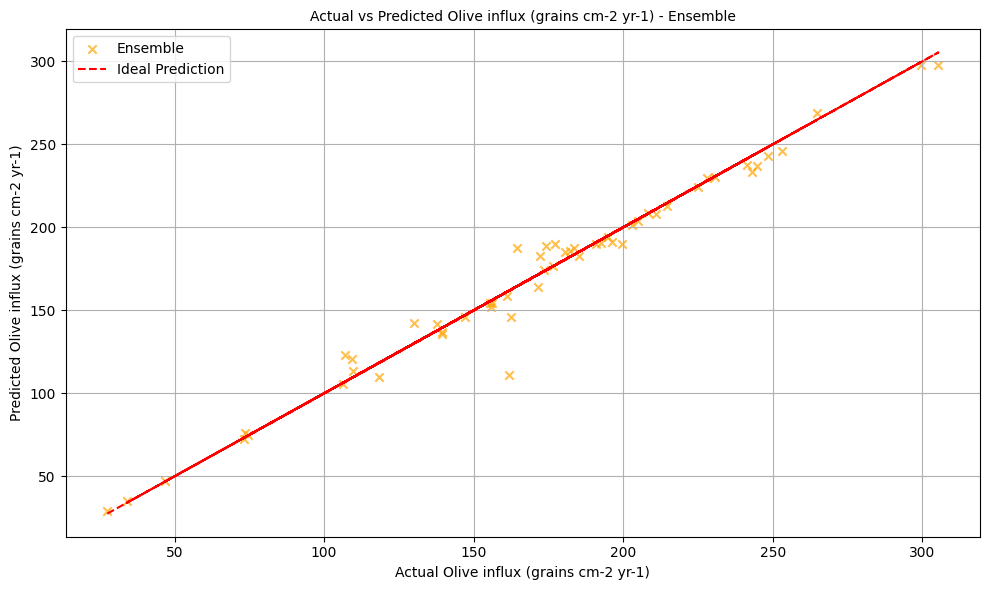

In [64]:
import matplotlib.pyplot as plt

# Define font size
font_size = 10

# Plotting for Huber Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Predicted Olive influx (grains cm-2 yr-1)'], c='blue', label='Huber Regression', marker='o', alpha=0.7)
plt.plot(rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_huber['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Huber Regression", fontsize=font_size)
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)", fontsize=font_size)
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)", fontsize=font_size)
plt.legend(fontsize=font_size)
plt.grid(True)
plt.tight_layout()
plt.savefig('huber_regression_plot3.pdf', dpi=400)  # Save as PDF with increased image quality
plt.show()

# Plotting for Bayesian Ridge Regression
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Predicted Olive influx (grains cm-2 yr-1)'], c='green', label='Bayesian Ridge Regression', marker='^', alpha=0.7)
plt.plot(rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_bayesian_ridge['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Bayesian Ridge Regression", fontsize=font_size)
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)", fontsize=font_size)
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)", fontsize=font_size)
plt.legend(fontsize=font_size)
plt.grid(True)
plt.tight_layout()
plt.savefig('bayesian_ridge_regression_plot3.pdf', dpi=400)  # Save as PDF with increased image quality
plt.show()

# Plotting for Ensemble
plt.figure(figsize=(10, 6))
plt.scatter(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Predicted Olive influx (grains cm-2 yr-1)'], c='orange', label='Ensemble', marker='x', alpha=0.7)
plt.plot(rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], rent_comparison_ensemble['Actual Olive influx (grains cm-2 yr-1)'], color='red', linestyle='--', label='Ideal Prediction')
plt.title("Actual vs Predicted Olive influx (grains cm-2 yr-1) - Ensemble", fontsize=font_size)
plt.xlabel("Actual Olive influx (grains cm-2 yr-1)", fontsize=font_size)
plt.ylabel("Predicted Olive influx (grains cm-2 yr-1)", fontsize=font_size)
plt.legend(fontsize=font_size)
plt.grid(True)
plt.tight_layout()
plt.savefig('ensemble_plot3.pdf', dpi=400)  # Save as PDF with increased image quality
plt.show()


In [60]:
from sklearn.linear_model import HuberRegressor, BayesianRidge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define hyperparameters
huber_epsilon = 1.35
bayesian_alpha_1 = 1e-6

# Create and evaluate Bayesian Ridge model with hyperparameters
bayesian_reg = BayesianRidge(alpha_1=bayesian_alpha_1)
bayesian_reg.fit(X_train, y_train)
bayesian_pred = bayesian_reg.predict(X_test)

# Create and evaluate HuberRegressor model with hyperparameters
huber_reg = HuberRegressor(epsilon=huber_epsilon)
huber_reg.fit(X_train, y_train)
huber_pred = huber_reg.predict(X_test)

# Ensemble prediction: taking the average of predictions
ensemble_pred = (bayesian_pred + huber_pred) / 2

# Calculate metrics for ensemble predictions
mae = mean_absolute_error(y_test, ensemble_pred)
mse = mean_squared_error(y_test, ensemble_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, ensemble_pred)
rmsle = np.sqrt(np.mean(np.log1p(ensemble_pred) - np.log1p(y_test)) ** 2)
mape = np.mean(np.abs((y_test - ensemble_pred) / y_test)) * 100

print("\nEnsemble Model (HuberRegressor + BayesianRidge):")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Root Mean Squared Logarithmic Error (RMSLE): {rmsle:.2f}")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")



Ensemble Model (HuberRegressor + BayesianRidge):
Mean Absolute Error (MAE): 5.67
Mean Squared Error (MSE): 95.10
Root Mean Squared Error (RMSE): 9.75
R-squared (R2): 0.97
Root Mean Squared Logarithmic Error (RMSLE): 0.00
Mean Absolute Percentage Error (MAPE): 3.64%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
